**NOTEBOOK DE GROUPE : Tran Khoi DANG, Kim Thang VO, Truong Minh TUE, Trung Thai DO**  
**DANS LE CADRE DU PROJET D'ANALYSE DE DONNÉES EN 4eme ANNÉE GMM INSA TOULOUSE (ANNÉE 2022-2023).**

# 1. INTRODUCTION 
**Description and aim.**  
The data are loading profiles of the bike stations over one week, collected every hour, from the period Monday 2nd Sept. - Sunday 7th Sept., 2014. The loading profile of a station, or simply loading, is defined as the ratio of number of available bikes divided by the number of bike docks. A loading of 1 means that the station is fully loaded, i.e. all bikes are available. A loading of 0 means that the station is empty, all bikes have been rent. From the viewpoint of data analysis, the individuals are the stations. The variables are the 168 time steps (hours in the week). The aim is to detect clusters in the data, corresponding to common customer usages. **This clustering should then be used to predict the loading profile.**

**Guidelines**
- Descriptive statistics.
- PCA to reduce dimension (originally > 150).
- Clustering on original data, on PCA coordinates. Other ideas : kernel PCA, coefficients of a suitable functional basis...
- Interpretation, comparison.

Timing. Start: February 4. End: May 17  
Organisation: By groups of 4.  
Deliverables: 2 notebooks, one in R, and its transcription in Python + 1 pdf report.   
The report is limited to 15 pages, including figures, and must not contain any code.   
It must contain an introduction, a conclusion, a synthesis for each section explaining the main conclusions.These synthesis & the conclusion summarize the main facts for somebody who do not want to read the details.  
Furthermore, all the results provided must be interpreted.


## 1.1. Data

The data are loading profiles of the bike stations over one week, collected every hour, from the period Monday 2nd Sept. - Sunday 7th Sept., 2014. The loading profile of a station, or simply loading, is defined as the ratio of number of available bikes divided by the number of bike docks. A loading of 1 means that the station is fully loaded, i.e. all bikes are available. A loading of 0 means that the station is empty, all bikes have been rent. From the viewpoint of data analysis, the individuals are the stations. The variables are the 168 time steps (hours in the week). 

## 1.2. Objective

The aim is to detect clusters in the data, corresponding to common customer usages. This clustering should then be used to predict the loading profile.

# 2. Exploratory data analysis

### 2.1. Necessary libraries installation & importation


In [ ]:
#install libraries
# install.packages('ggplot2')
# install.packages('corrplot')
# install.packages('FactoMineR')
# install.packages('ggmap')
# install.packages('factoextra')
# install.packages('ggpubr')
# install.packages('ggpubr')
# install.packages('mclust')

In [ ]:
 #libraries import
library('ggplot2')
library('corrplot')
library('FactoMineR')
library('ggmap')
library('factoextra')
library('ggpubr')

## 2.2. Reading data

In [ ]:
# direct loading from data files
# need to upload files needed, alternative is usage of the velib dataset of R
load("velib.RData")
head(velib$data, 5)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,⋯,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
19117,0.07692308,0.2692308,0.3846154,0.23076923,0.1538462,0.15384615,0.26923077,0.08000000,0.1153846,0.1153846,⋯,0.29629630,0.1111111,0.1111111,0.1481481,0.30769231,0.07692308,0.1153846,0.07692308,0.1538462,0.1538462
17111,0.04347826,0.0000000,0.1304348,0.08695652,0.1739130,0.08695652,0.04347826,0.04347826,0.2173913,0.3043478,⋯,0.04347826,0.0000000,0.2173913,0.1304348,0.04545455,0.17391304,0.1739130,0.17391304,0.2608696,0.3913043
6103,0.10909091,0.1272727,0.1272727,0.18181818,0.1454545,0.10909091,0.25454545,0.25454545,0.2545455,0.3272727,⋯,0.25925926,0.2592593,0.2037037,0.1296296,0.14814815,0.29629630,0.3148148,0.37037037,0.3703704,0.4074074
15042,0.57142857,0.5238095,0.6666667,0.71428571,0.8095238,1.00000000,1.00000000,0.95238095,0.9523810,0.9523810,⋯,1.00000000,1.0000000,0.9047619,0.8571429,0.85714286,0.85714286,0.7619048,0.76190476,0.7619048,0.7619048
12003,1.00000000,0.9420290,1.0000000,0.98550725,1.0000000,1.00000000,1.00000000,1.00000000,0.9710145,0.9565217,⋯,0.22727273,0.4545455,0.5909091,0.8333333,1.00000000,0.81818182,0.6363636,0.71212121,0.6212121,0.5757576


## 2.3. Data cleaning

In [ ]:
#names of stations are stored in velib$names
#search for duplicated names of stations : suggest to rename duplicated names (same name but different position!)
sort(velib$names[duplicated(velib$names)])

[1] " ALEXANDRE DUMAS"       " AQUEDUC"               " BASTILLE"             
 [4] " BELLEVILLE"            " BOURSE DU TRAVAIL"     " BROCHANT"             
 [7] " CHERCHE MIDI"          " CLICHY"                " DODU"                 
[10] " FAURE (AUBERVILLIERS)" " FRANCE (LEVALLOIS)"    " GARE D'AUSTERLITZ"    
[13] " GARE D'AUSTERLITZ"     " GARE DE L'EST"         " JOURDAIN"             
[16] " LACEPEDE"              " LEGENDRE"              " PARC DE BELLEVILLE"   
[19] " PORT ROYAL"            " PORTE DE BAGNOLET"     " PORTE DE SAINT OUEN"  
[22] " PORTE DES LILAS"       " PORTE DES LILAS"       " RICHARD LENOIR"       
[25] " SAINT AUGUSTIN"        " SAINT HONORE"          " SAINT MARCEL"         
[28] " WILSON (LEVALLOIS)"

In [ ]:
#index of all duplicated names of stations
which(duplicated(velib$names))

[1]  210  345  361  395  450  493  500  535  546  676  693  702  785  830  864
[16]  886  957  980 1018 1047 1056 1085 1091 1104 1111 1113 1180 1182

In [ ]:
#rename the stations with a dummy number of appearance in the dataset (the stations with duplicated names have different geography location -> rename)
#recheck if there are still duplicated names of stations or not
station_names = ave(as.character(velib$names), velib$names, FUN=function(x) if (length(x)>1) paste0(x[1], '(', seq_along(x), ')') else x[1])
which(duplicated(station_names))

integer(0)

In [ ]:
# data preparation : we choose only 168 hours(variables) in the period that we want to observe
x <- (velib$data)
colnames(x) <- 1:ncol(x)
rownames(x) <- station_names

n <- nrow(x)
stations <- 1:n 
coord <- velib$position[stations,] #longitude and lattitude

# select exactly 7 days of data (we remove the first 13 dates)
dates <- 14:181
x <- x[stations, dates]
colnames(x) <- 1:length(dates) #reindex from 1 to 168

In [ ]:
head(x) # first lines of dataset
dim(x) #dimension of dataset with 1189 rows(stations) and 168 columns(variables of loading score corresponding to each hour observed in the period)

,1,2,3,4,5,6,7,8,9,10,⋯,159,160,161,162,163,164,165,166,167,168
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
EURYALE DEHAYNIN,0.03846154,0.03846154,0.07692308,0.03846154,0.03846154,0.03846154,0.03846154,0.03846154,0.10714286,0.00000000,⋯,0.29629630,0.11111111,0.1111111,0.14814815,0.30769231,0.07692308,0.11538462,0.07692308,0.1538462,0.1538462
LEMERCIER,0.47826087,0.47826087,0.47826087,0.43478261,0.43478261,0.43478261,0.43478261,0.43478261,0.26086957,0.04347826,⋯,0.04347826,0.00000000,0.2173913,0.13043478,0.04545455,0.17391304,0.17391304,0.17391304,0.2608696,0.3913043
MEZIERES RENNES,0.21818182,0.14545455,0.12727273,0.10909091,0.10909091,0.10909091,0.09090909,0.09090909,0.05454545,0.10909091,⋯,0.25925926,0.25925926,0.2037037,0.12962963,0.14814815,0.29629630,0.31481481,0.37037037,0.3703704,0.4074074
FARMAN,0.95238095,0.95238095,0.95238095,0.95238095,0.95238095,0.95238095,0.95238095,1.00000000,1.00000000,1.00000000,⋯,1.00000000,1.00000000,0.9047619,0.85714286,0.85714286,0.85714286,0.76190476,0.76190476,0.7619048,0.7619048
QUAI DE LA RAPEE,0.92753623,0.81159420,0.73913043,0.72463768,0.72463768,0.72463768,0.72463768,0.72463768,0.75362319,0.97101449,⋯,0.22727273,0.45454545,0.5909091,0.83333333,1.00000000,0.81818182,0.63636364,0.71212121,0.6212121,0.5757576
CHOISY POINT D'IVRY,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.08333333,0.00000000,⋯,0.34782609,0.08695652,0.1153846,0.08695652,0.13043478,0.08695652,0.08695652,0.43478261,0.3913043,0.5217391


[1] 1189  168

In [ ]:
#check for missing values
print(paste("Number of missing values in dataset : ", sum(sapply(x, function(x) sum(is.na(x)))))) #0

[1] "Number of missing values in dataset :  0"


## 2.4. Data visualization

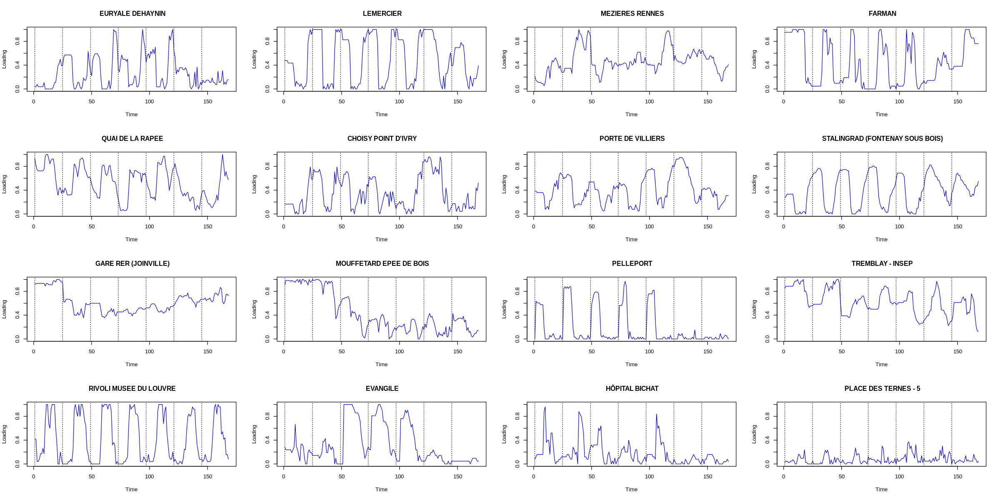

In [ ]:
#plot loading score in the period observed of the first 16 stations in the dataset
timeTick <- 1 + 24*(0:6)  # vector corresponding to the beginning of days
par(mfrow = c(4, 4))
options(repr.plot.width = 20, repr.plot.height = 10)
for (i in 1:16) {
    matplot(t(x[i, ]), col = "blue", type = "l", ylim = c(0, 1), 
     xlab = "Time", ylab = "Loading", main = velib$names[i])
    abline(v = timeTick, lty = "dotted")
}

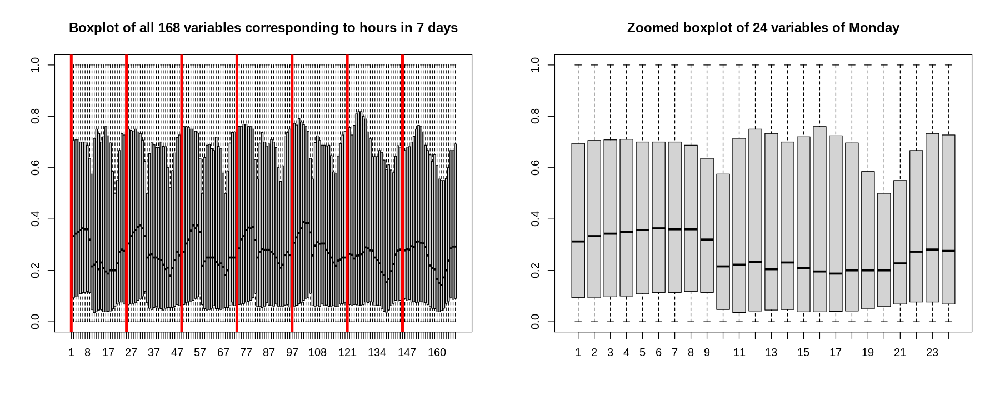

In [ ]:
# Boxplot of all 168 variables (loading score for each hour in 7 days) (left graph)
# Boxplot of 24 first variables (loading score of 24 hours of Monday) (right graph) 
par(mfrow = c(1, 2))
options(repr.plot.width = 15, repr.plot.height = 6)
boxplot(x[, ], main = "Boxplot of all 168 variables corresponding to hours in 7 days")
abline(v = timeTick, col= 'red', lwd = 4)

boxplot(x[, 1:24], main = "Zoomed boxplot of 24 variables of Monday")

**Boxplot interpretation**

Distribution : 
- position :  median of all variables are around 0.3
- dispersion : intervalle inter-quartile -> in general constant, range from 0.05 to 0.7, lower dispersion in hours where people rent more (late afternoon)
- symmetry : no symetry(or gaussian), median closer to lowerquantile -> Positively Skewed, mean > median, data constitued of more higher score, less people rent (all compared to median)
- no ouliers, we take all values from 0 to 1.
- difference in day : no difference remarkable, on saturday sunday people tends to rent more at early morning
- difference in hours : early morning and late night people doesn't rent bike


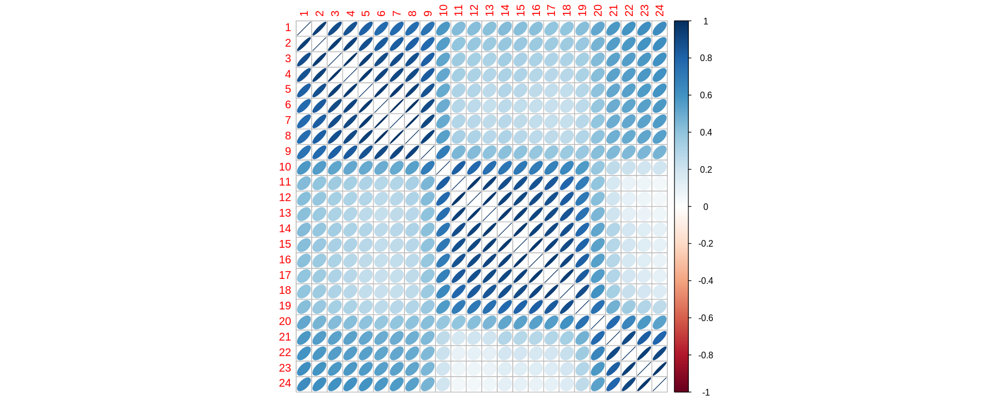

In [ ]:
#corrplot 24 first variables correponding to 24 hours of monday  
corrplot(cor(x[, 1:24]), method='ellipse')

**Corrplot interpretation**  
In general, we see that the loading scores between different times are positively correlated. We see the groups of strong correlation (the morning, afternoon and evening loading scores)


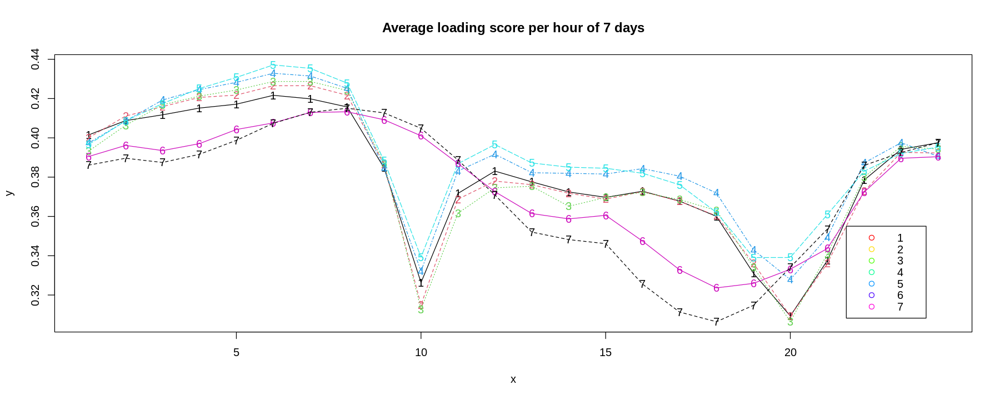

In [ ]:
#plot average loading score per hour of 7 days
avg_hourly <- colMeans(x)
avg_hourly_daywise <- t(matrix(avg_hourly, nrow = 7, byrow = TRUE)) #24x7
matplot(avg_hourly_daywise, type = "o", xlab = "x", ylab = "y", main="Average loading score per hour of 7 days")
legend("bottomright", inset=.05, legend=1:7, pch=1, col=rainbow(7))


**Interpretation**

- Weekday (from Monday to Friday) : similar behavior 
- Weekend (Saturday & Sunday): different behavior than weekday (maybe people wake up later in the morning)


ℹ Using `zoom = 12`

ℹ Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.



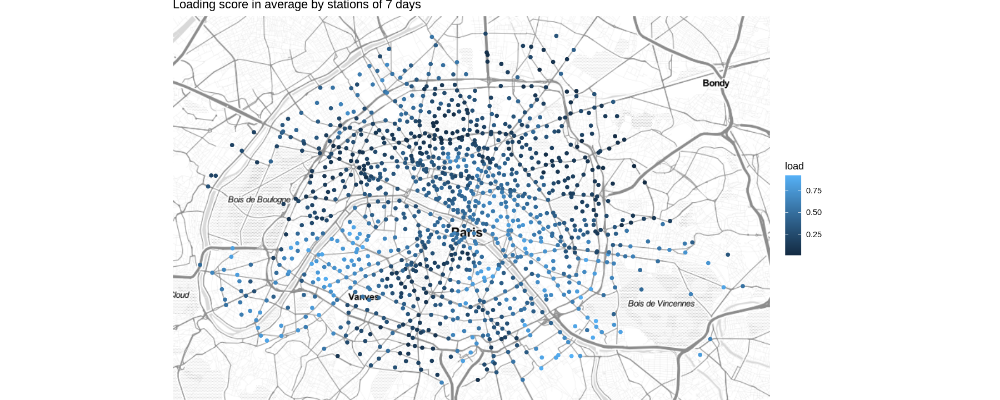

In [ ]:
#average loading score over the period of all stations represented in the map of Paris center
load <- rowMeans(x)
qmplot(longitude, latitude, data = velib$position, color = load, main="Loading score in average by stations of 7 days") 

### 2.3.1. ADDITIONAL INFO : Interpret additional hill info

In [ ]:
# data preparation : add extra column with the hill information of the station
x[, "hill"] = as.factor(velib$bonus==1) 

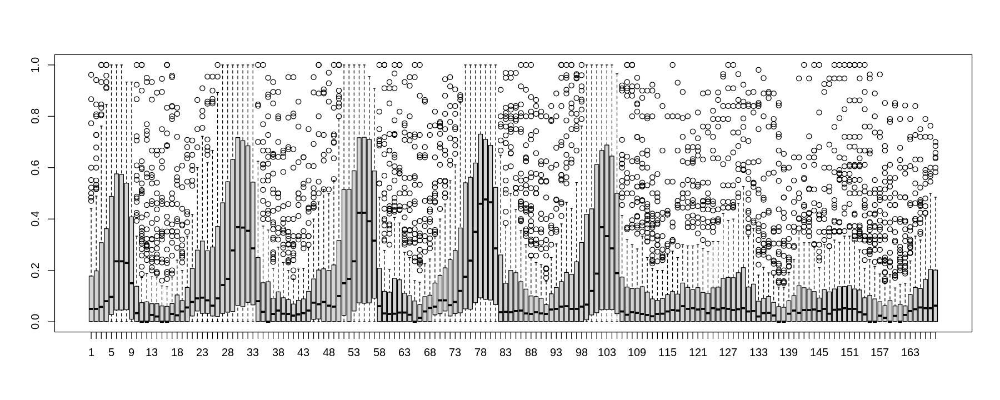

In [ ]:
# Boxplots of stations of hills
options(repr.plot.width = 15, repr.plot.height = 6)
x_hill = x[1:168][which(x[, "hill"]==TRUE),]
boxplot(x_hill)

**Interpretation**
loading score significantly low on Saturday and Sunday : people who play on Fridays don't want to put the bikes back on the hills, so the stations are always short of bikes on Saturday and Sunday.

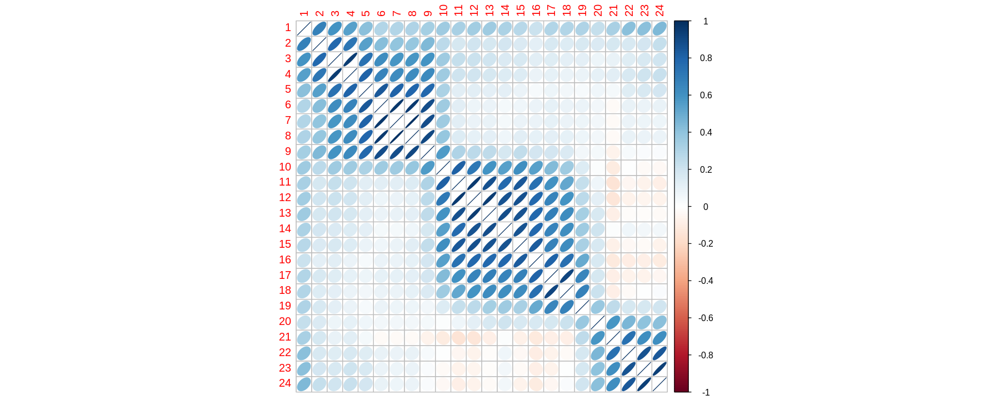

In [ ]:
#corrplot of first 24 hours of all hill stations only
corrplot(cor(x_hill[1:24]), method='ellipse')

**Interpretation**  
We see the slightly negative correlations between the loading scores in the afternoon and in the evening: which perhaps comes down to the fact that we are too tired and we no longer want to put the bikes back on the hills.

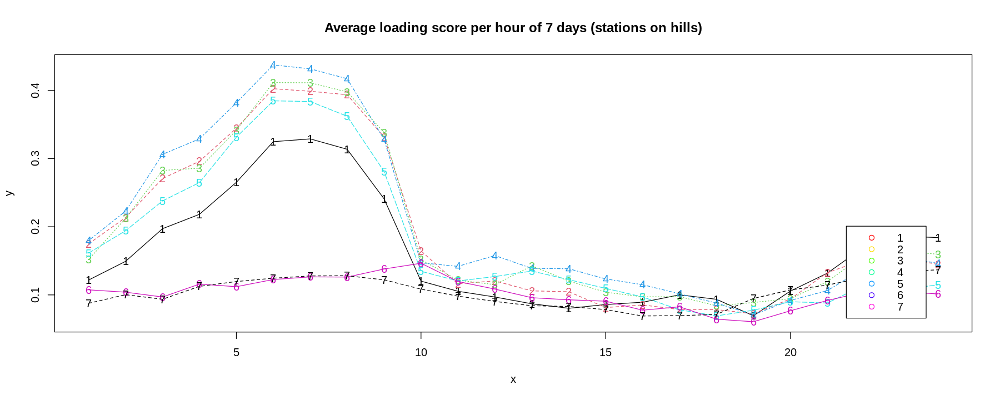

In [ ]:
#plot average loading score per hour of 7 days (stations on hills)
avg_hourly <- colMeans(x_hill)
avg_hourly_daywise <- t(matrix(avg_hourly, nrow = 7, byrow = TRUE)) #24x7
matplot(avg_hourly_daywise, type = "o", xlab = "x", ylab = "y", main="Average loading score per hour of 7 days (stations on hills)")
legend("bottomright", inset=.05, legend=1:7, pch=1, col=rainbow(7))


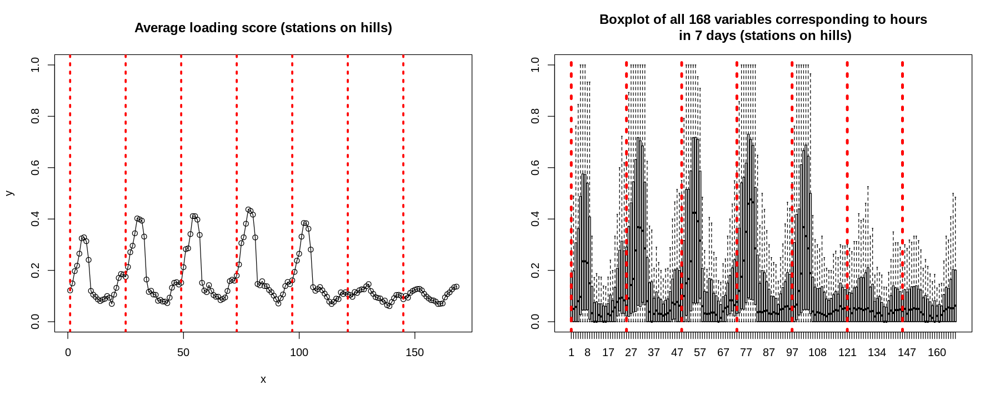

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 6)
par(mfrow = c(1, 2))

plot(avg_hourly, type = "o", xlab = "x", ylab = "y",ylim = c(0, 1), main="Average loading score (stations on hills)")
abline(v = timeTick, col= 'red', lwd = 3, lty='dotted')

boxplot(x_hill, main="Boxplot of all 168 variables corresponding to hours\n in 7 days (stations on hills)", outline=FALSE)
abline(v = timeTick, col= 'red', lwd = 4, lty='dotted')


# 3. ANALYSIS BY PCA

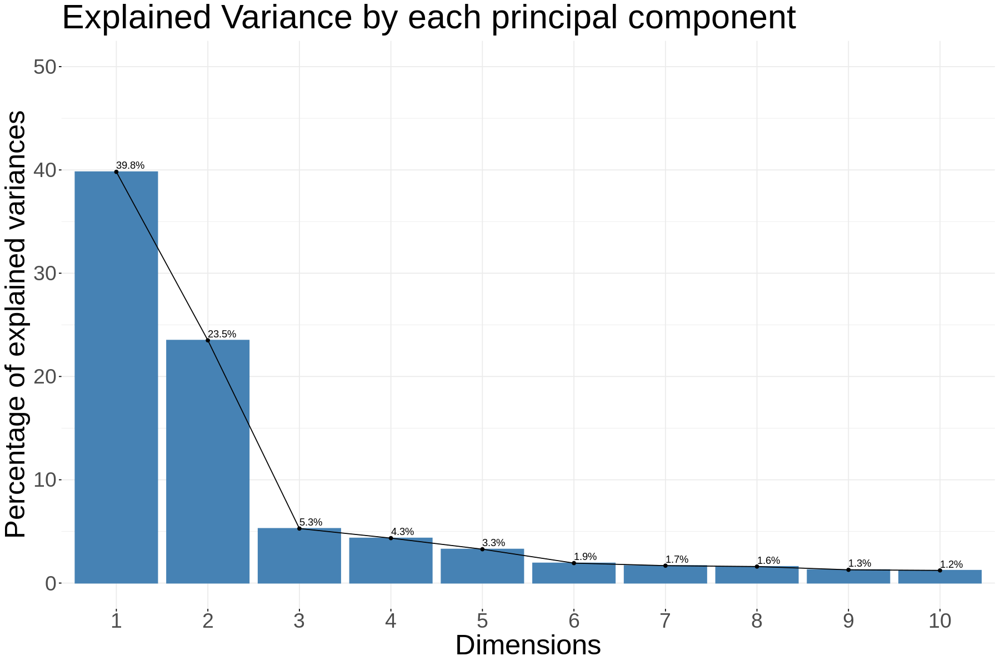

In [ ]:
# PCA with FactoMineR
options(repr.plot.width = 12, repr.plot.height = 8)
acp <- PCA(x, scale.unit = TRUE, ncp = 10, quali.sup = 169, graph = F)
options(repr.plot.width = 15, repr.plot.height = 10)
# barplot of the inertias and percentage of inertia associated to each principal component
fviz_screeplot(acp, addlabels = TRUE, ylim = c(0, 50), title ='Explained Variance by each principal component')+
  theme(text = element_text(size = 30.5), axis.text = element_text(size = 22.5))

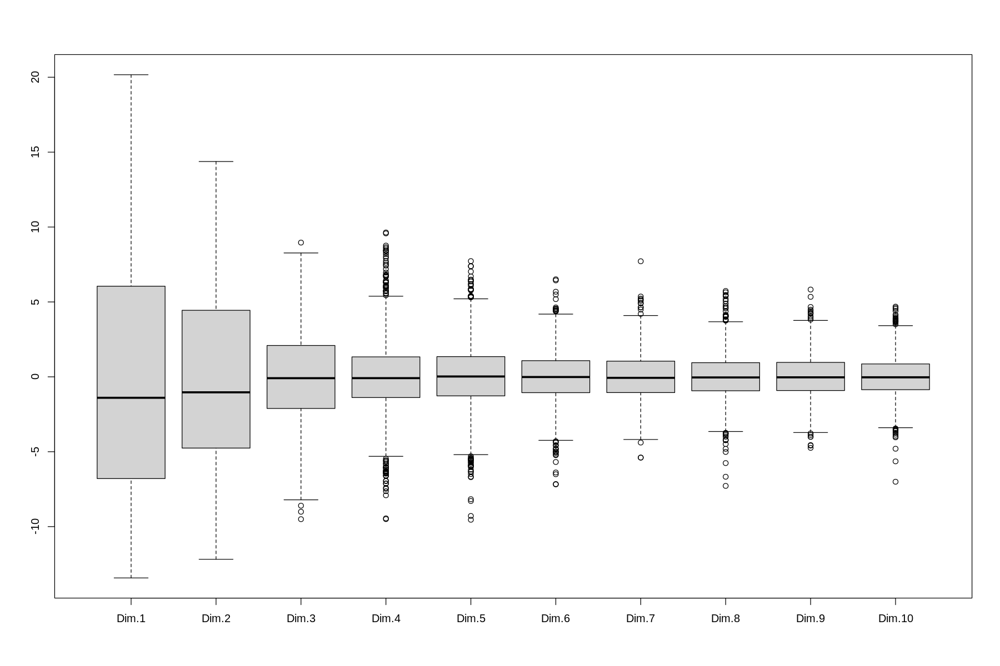

In [ ]:
#boxplot individual coordinates per component 
boxplot(acp$ind$coord)

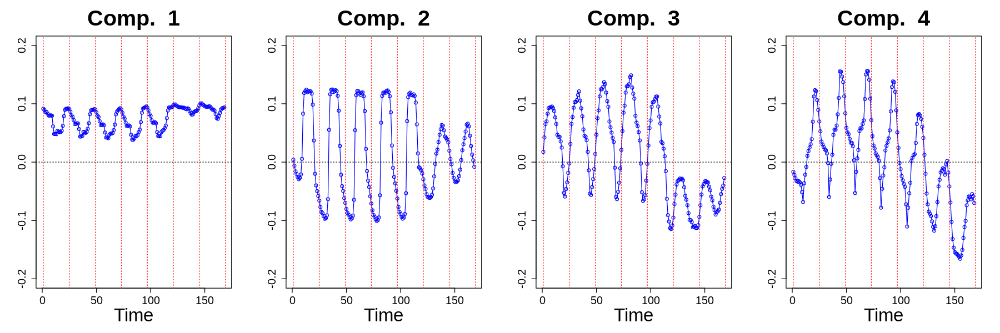

In [ ]:
timeTick <- 1 + 24*(0:7)  # vector corresponding to the beginning of days

options(repr.plot.width = 15, repr.plot.height = 5)
par(mfrow = c(1, 4))
for (i in 1:4){
    plot(acp$svd$V[, i], type = "o", main = paste("Comp. ", i), xlab = "Time", ylab = "",
         ylim = c(-0.2, 0.2), col = "blue", cex.lab=2.5, cex.main=3, cex.axis=1.5)
    abline(h = 0, lty = "dotted")
    abline(v = timeTick, col= 'red', lwd = 1, lty = "dotted")
}

**Interpretation**  
We can deduce that the first component represents the average loading score, the second component represents the difference of averages, with off-peak at mori, the third explains a little the contrasts of loading score between hours (especially afternoon and evening)

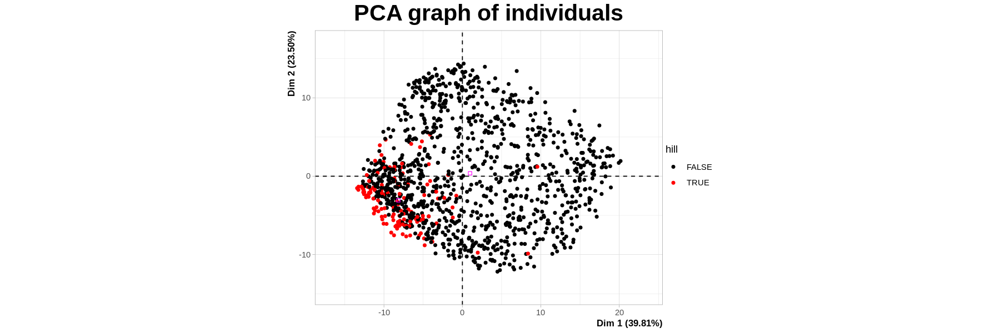

In [ ]:
#graph individuals of PCA With extra marker on stations with HILL
plot(acp, label="non", habillage = 169, cex.main=2.25)

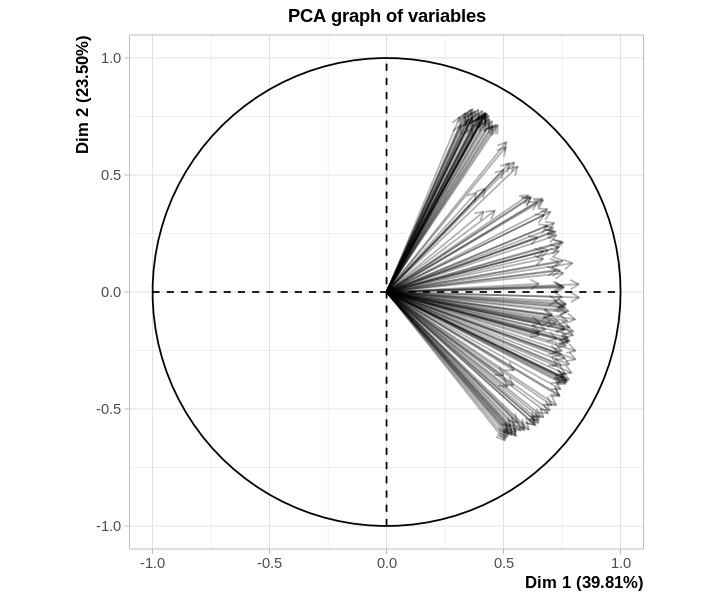

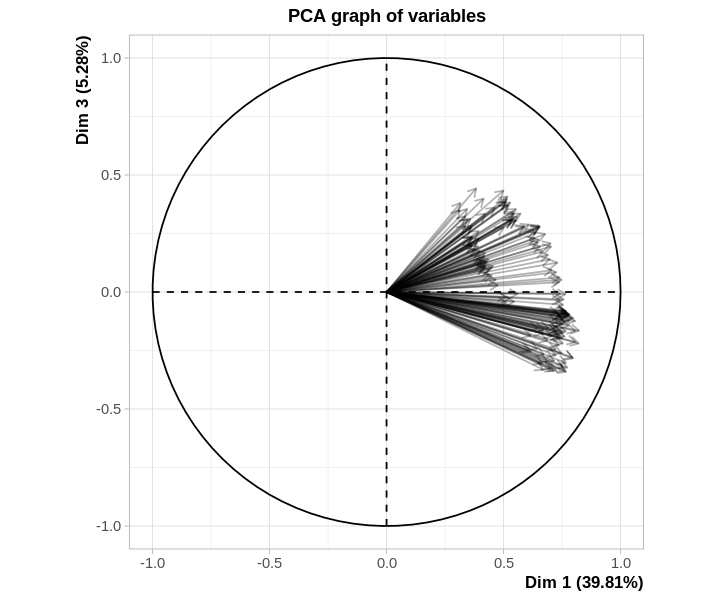

In [ ]:
# Representation of the variables
options(repr.plot.width = 6, repr.plot.height = 5)
par(mfrow = c(1,2))
plot(acp, axes = c(1, 2), choix = "var", label = 'none')
plot(acp, axes = c(1, 3), choix = "var", label = 'none')

# 4. CLUSTERING by Kmeans  

## 4.1. Kmeans on full data

In [ ]:
# par(mfrow = c(1, 2))
# fviz_nbclust(x[ ,1:168], FUNcluster = kmeans,method = "wss") + ggtitle("Optional number of cluster according Elbow")
# fviz_nbclust(x[ ,1:168], FUNcluster = kmeans,method = "silhouette") + ggtitle("Optional number of cluster with silhouette")

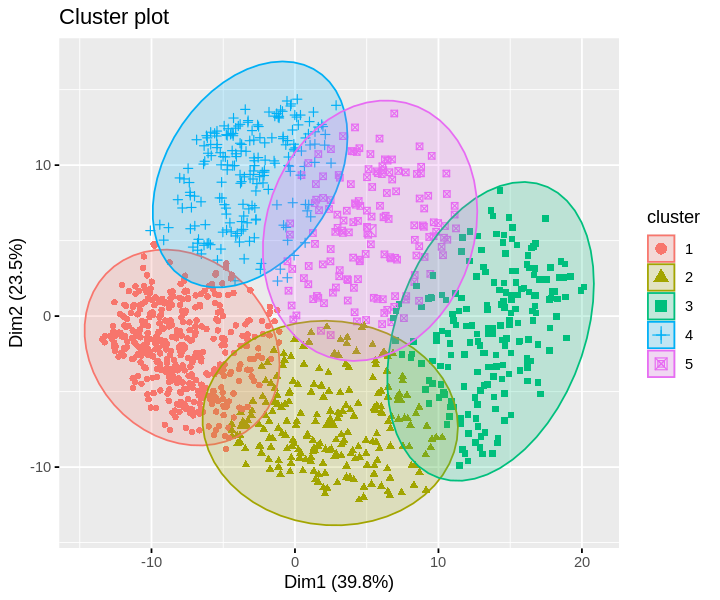

In [ ]:
num_cluster = 5
km.brutes = kmeans(x[ ,1:168],centers = num_cluster, nstart = 100)
fviz_cluster(km.brutes, x[ ,1:168], ellipse.type = "norm",labelsize=0)

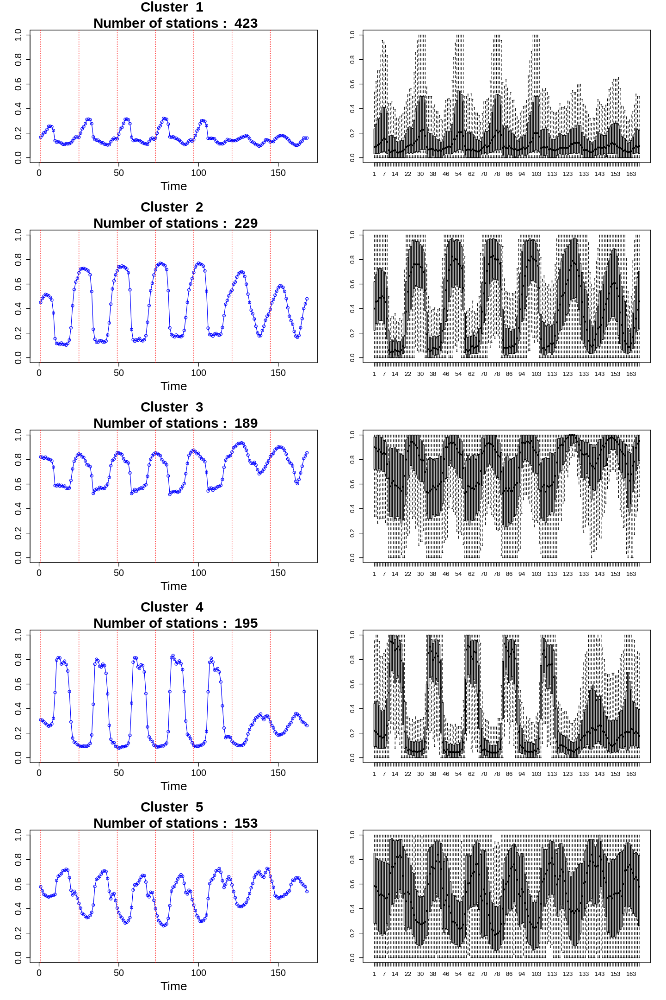

In [ ]:
timeTick <- 1 + 24*(0:6)  # vector corresponding to the beginning of days
par(mfrow = c(max(km.brutes$cluster), 2*max(km.brutes$cluster)/max(km.brutes$cluster)))
options(repr.plot.width = 12, repr.plot.height = 18)
for (i in 1:max(km.brutes$cluster)){
    avg_hourly <- colMeans(x[ ,1:168][which(km.brutes$cluster == i),1:168])
    plot(avg_hourly, type = "o", 
         main = paste("Cluster ", i, "\n Number of stations : ", 
                      length(which(km.brutes$cluster == i))), 
         xlab = "Time", 
         ylab = "",
         ylim = c(0, 1), col = "blue", 
         cex.main = 2.25, cex.lab=2, cex.axis=1.5)
    abline(v = timeTick, col= 'red', lwd = 1, lty = "dotted")
    boxplot(x[ ,1:168][which(km.brutes$cluster == i),1:168], outline=FALSE)
}

ℹ Using `zoom = 12`

ℹ Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.



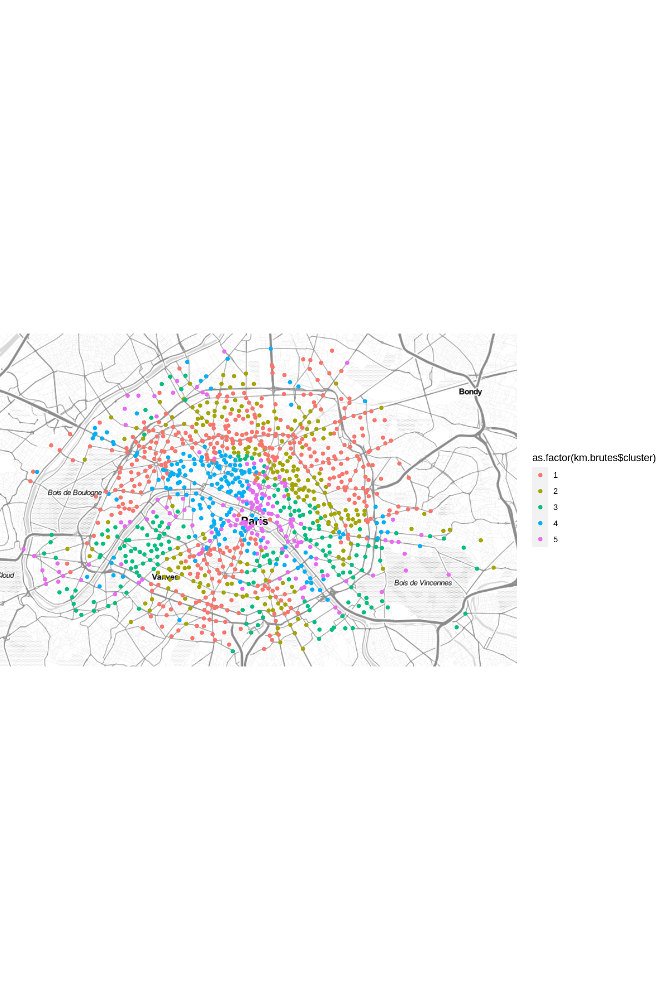

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 15)
qmplot(longitude,latitude, data = velib$position,color = as.factor(km.brutes$cluster))

## 4.2. Kmeans on PCA

In [ ]:
# fviz_nbclust(acp$ind$coord[, 1:4], FUNcluster=kmeans, method="wss") +
#     ggtitle("Optional number of cluster according Elbow (wss)")
# fviz_nbclust(acp$ind$coord[, 1:4], FUNcluster=kmeans, method="silhouette") +
#     ggtitle("Optional number of cluster according Elbow (silhouhelle score)")

In [ ]:
num_cluster = 5
km.pca <- kmeans(acp$ind$coord[, 1:4], centers = num_cluster, nstart = 100)

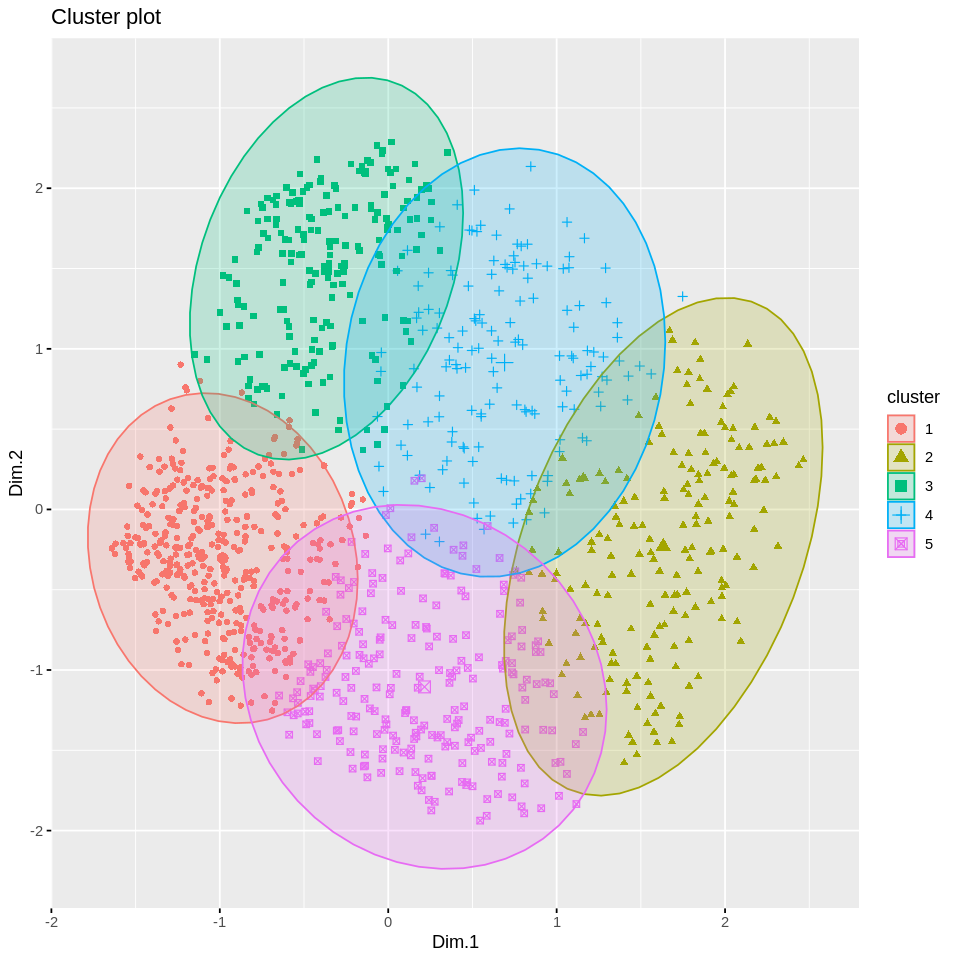

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)
fviz_cluster(km.pca, acp$ind$coord[, 1:2], ellipse.type = "norm", labelsize=0, habillage=169)

       
          1   2   3   4   5
  FALSE 300 194 190 153 225
  TRUE  111   1   4   0  11

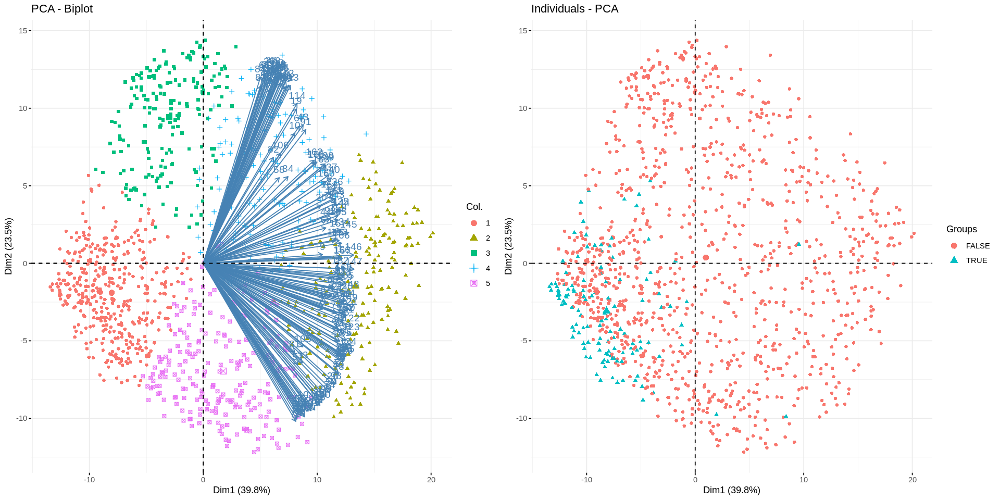

In [ ]:
options(repr.plot.width = 16, repr.plot.height = 8)

#number of hills station in each cluster
table(x$hill, as.factor(km.pca$cluster))

#biplot PCA with kmeans clusters on left, and hill stations markers on right
ggarrange(
    fviz_pca(acp, col.ind=as.factor(km.pca$cluster), geom = c("point"), axes=c(1,2)),
    fviz_pca_ind(acp,axes=c(1,2), geom=c("point"), habillage=x$hill)
)

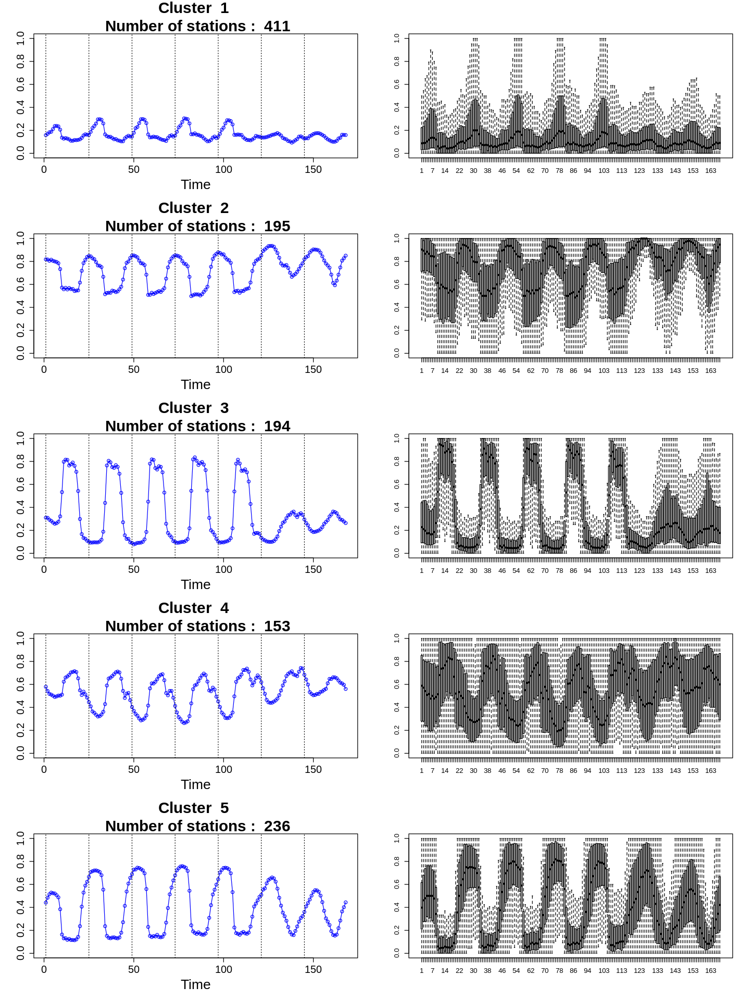

In [ ]:
timeTick <- 1 + 24*(0:6)  # vector corresponding to the beginning of days
par(mfrow = c(max(km.brutes$cluster), 2*max(km.brutes$cluster)/max(km.brutes$cluster)))
options(repr.plot.width = 12, repr.plot.height = 16)

for (i in 1:max(km.pca$cluster)){
    avg_hourly <- colMeans(x[which(as.factor(km.pca$cluster) == i), 1:168])
    plot(avg_hourly, type = "o", 
         main = paste("Cluster ", i, 
                      "\n Number of stations : ", length(which(km.pca$cluster == i)))
         , xlab = "Time", ylab = "",
         ylim = c(0, 1), col = "blue", 
         cex.main = 2.25, cex.lab=2, cex.axis=1.5)
    abline(v = timeTick, lty = "dotted")
    boxplot(x[ ,1:168][which(km.pca$cluster == i),1:168], outline=FALSE)

}

ℹ Using `zoom = 12`

ℹ Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.



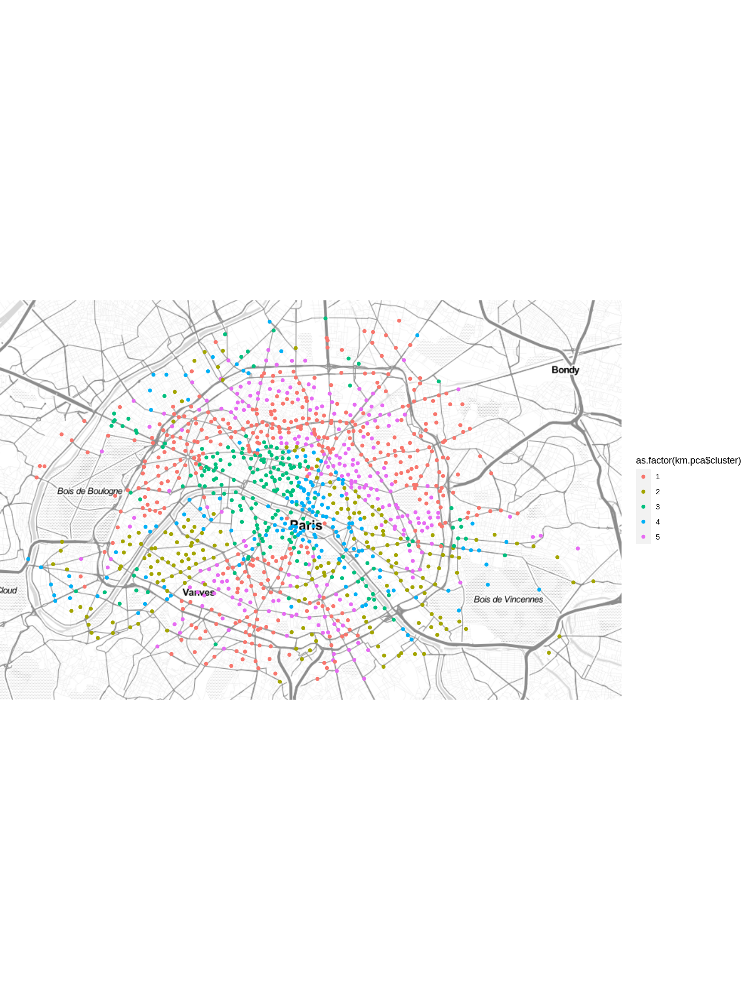

In [ ]:
qmplot(longitude,latitude, data = velib$position,color = as.factor(km.pca$cluster))

# 5. CLUSTERING by Agglomerative Hierarchical Clustering


## AHC on full data

Warning message:
“The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as
of ggplot2 3.3.4.
ℹ The deprecated feature was likely used in the factoextra package.
  Please report the issue at <https://github.com/kassambara/factoextra/issues>.”


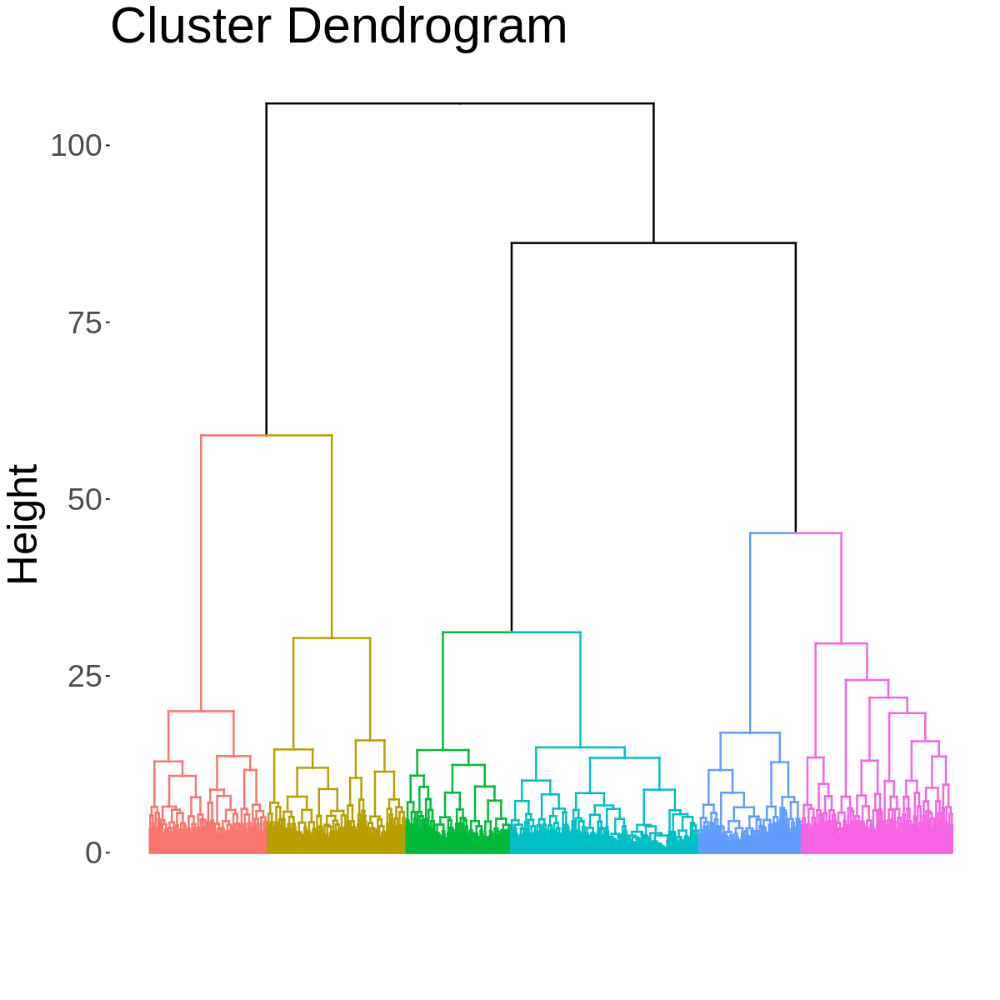

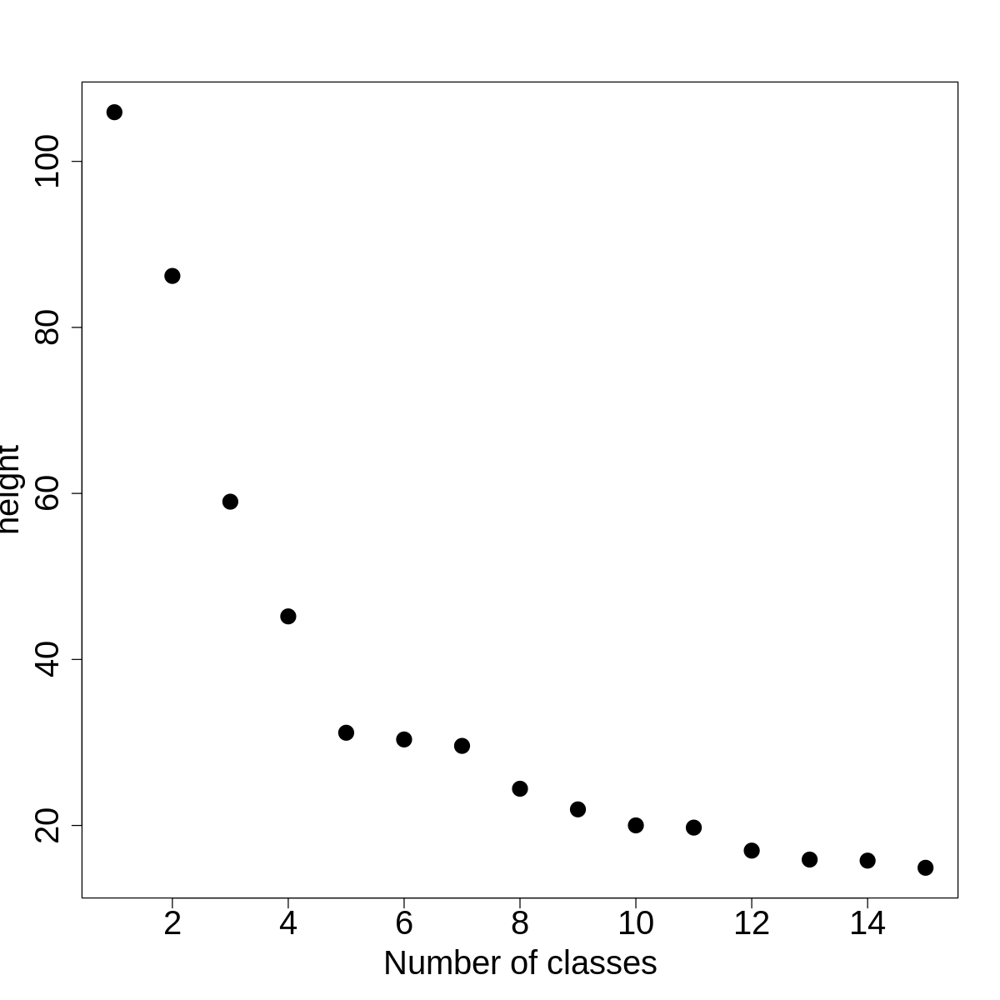

In [ ]:
dis.full = dist(x[,1:168], method="euclidean")

# Clustering
hclust.full = hclust(dis.full, method="ward.D2")

# Dendograms visualization
options(repr.plot.width=10, repr.plot.height=10)
num_cluster = 6
fviz_dend(hclust.full,k=num_cluster, show_labels=FALSE,color_labels_by_k = TRUE) + theme(text = element_text(size = 30.5), axis.text = element_text(size = 22.5))

# Choice of number of clusters
plot(rev(hclust.full$height)[1:15], xlab = "Number of classes", ylab = "height", 
     cex.lab = 2, cex.main = 2, cex.axis = 2, cex = 2, pch = 19)

In [ ]:
cut.full = cutree(hclust.full, num_cluster)

        
cut.full FALSE TRUE
       1   171    4
       2   221    3
       3    98   57
       4   152    0
       5   216   62
       6   204    1

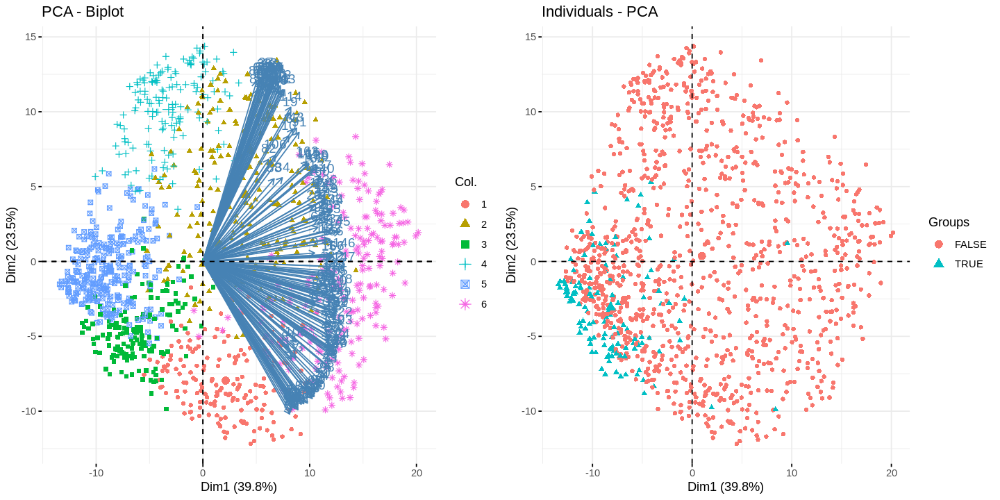

In [ ]:
# Clusters vs Hill--NoHill
table(cut.full, x$hill)

options(repr.plot.width = 12, repr.plot.height = 6)

ggarrange(
    fviz_pca(acp, col.ind=as.factor(cut.full), geom=c("point"), axes=c(1,2)),
    fviz_pca_ind(acp, axes=c(1,2), geom=c("point"), habillage=x$hill)
)

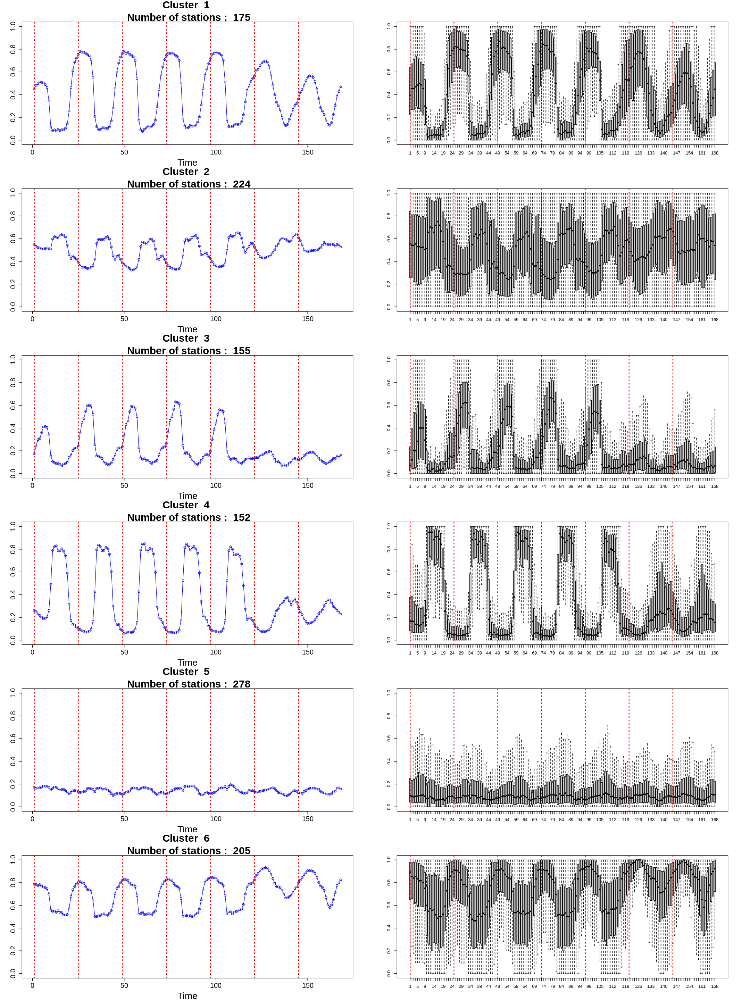

In [ ]:

timeTick <- 1 + 24*(0:6)  # vector corresponding to the beginning of days
par(mar=c(4,4,4,4), mfrow = c(6, 2))
options(repr.plot.width = 18, repr.plot.height = 24)

for (i in 1:max(cut.full)){
    avg_hourly <- colMeans(x[which(as.factor(cut.full) == i), 1:168])
    plot(avg_hourly, type = "o", 
         main = paste("Cluster ", i, 
                      "\n Number of stations : ", length(which(cut.full == i)))
         , xlab = "Time", ylab = "",
         ylim = c(0, 1), col = "blue", 
         cex.main = 2.25, cex.lab=2, cex.axis=1.5)
    abline(v = timeTick, lty = "dotted", col= 'red', lwd = 2)
    boxplot(x[ ,1:168][which(cut.full == i),1:168], outline=FALSE, ylim=c(0, 1))
    abline(v = timeTick, lty = "dotted", col= 'red', lwd = 2)
}

## AHC on PCA

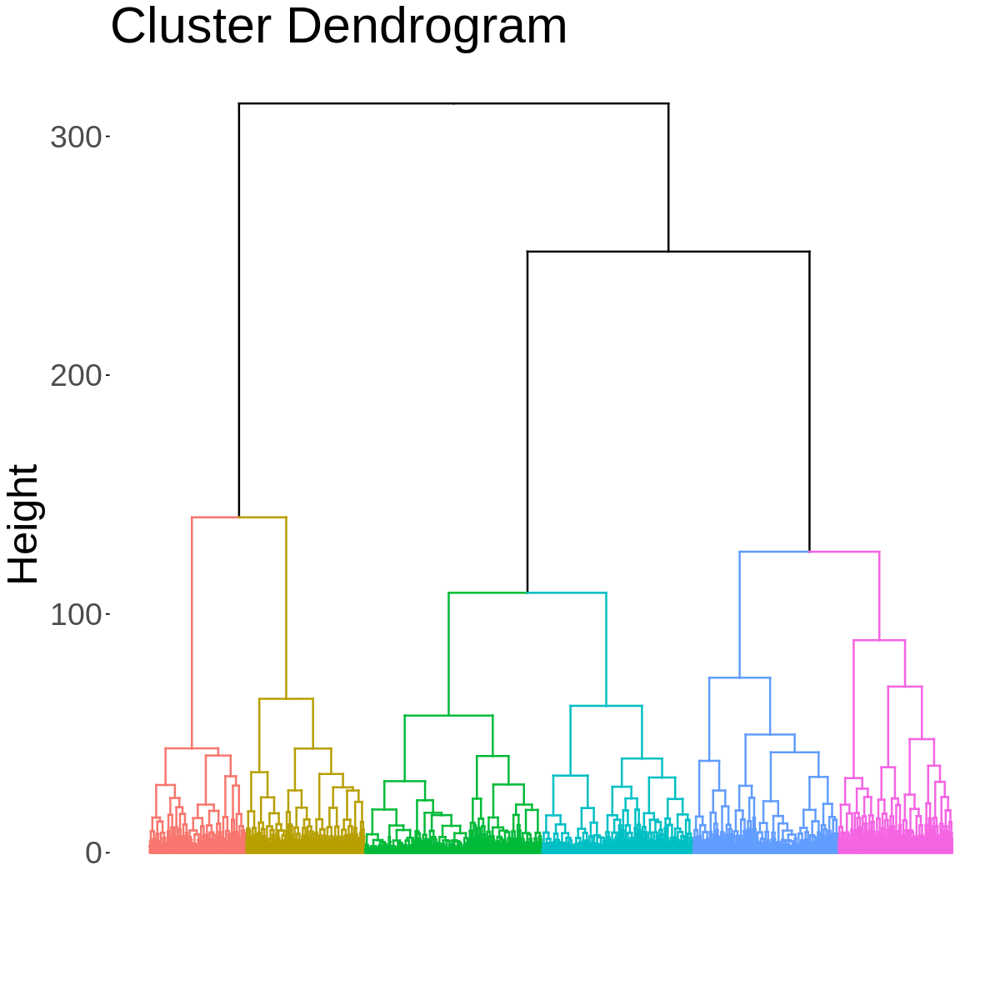

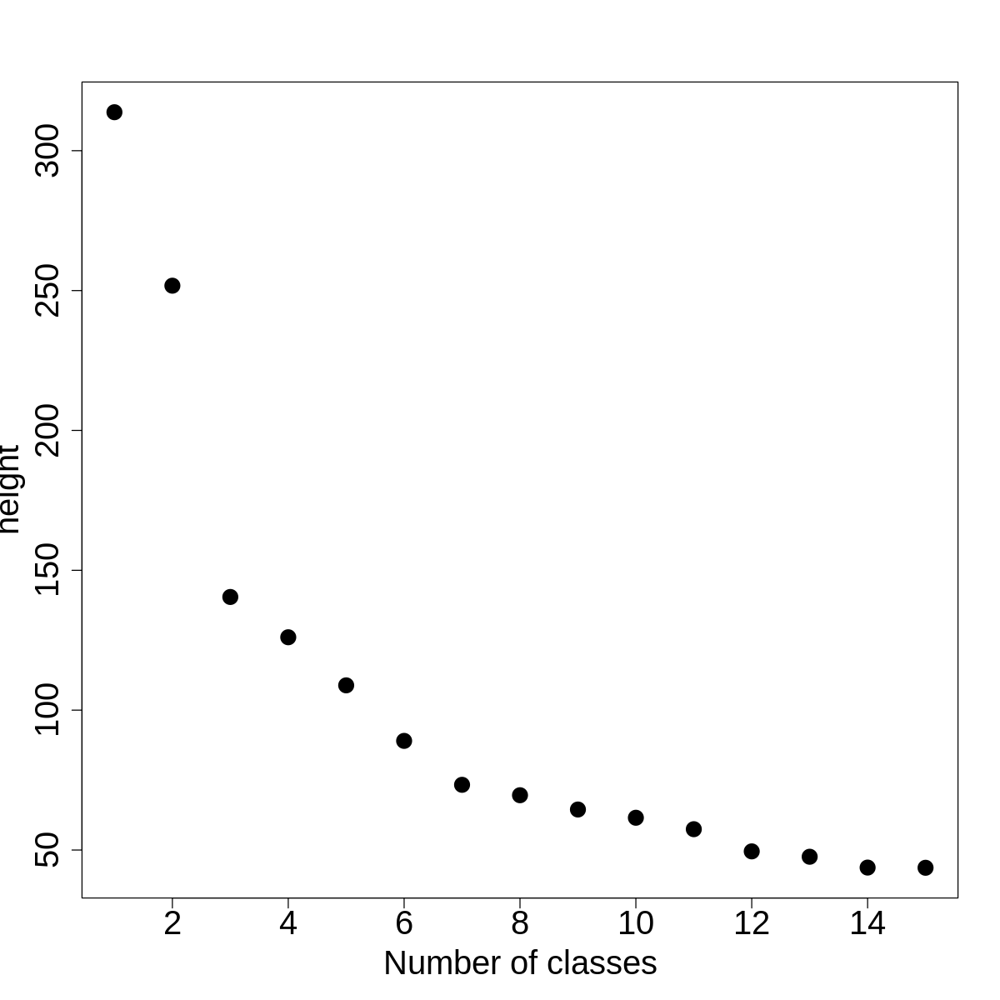

In [ ]:
diss.pca = dist(acp$ind$coord[, 1:10], method="euclidean")

# Clustering
hclust.pca = hclust(diss.pca, method="ward.D2")

#Dendograms visualization
options(repr.plot.width=10, repr.plot.height=10)
num_cluster = 6
fviz_dend(hclust.pca,k=num_cluster, show_labels=FALSE,color_labels_by_k = TRUE,cex=15) +theme(text = element_text(size = 30.5), axis.text = element_text(size = 22.5))


# Choice of number of clusters
plot(rev(hclust.pca$height)[1:15], xlab = "Number of classes", ylab = "height", 
     cex.lab = 2, cex.main = 2, cex.axis = 2, cex = 2, pch = 19)

       
cut.pca FALSE TRUE
      1   166   58
      2   174    2
      3   210    5
      4   142    1
      5   168    1
      6   202   60

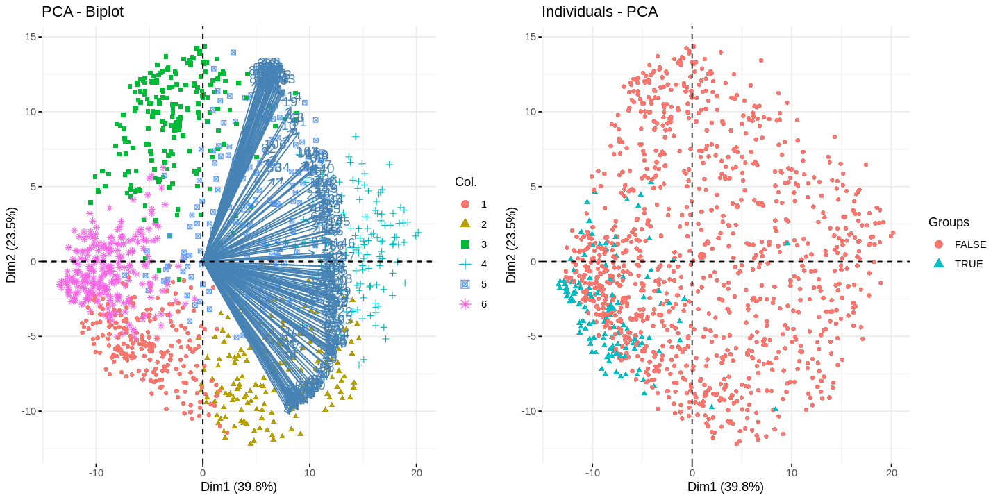

In [ ]:
# Clusters vs Hill--NoHill
cut.pca = cutree(hclust.pca,k=num_cluster)
table(cut.pca, x$hill)

options(repr.plot.width = 12, repr.plot.height = 6)

ggarrange(
    fviz_pca(acp, col.ind=as.factor(cut.pca), geom=c("point"), axes=c(1,2)),
    fviz_pca_ind(acp, axes=c(1,2), geom=c("point"), habillage=x$hill)
)

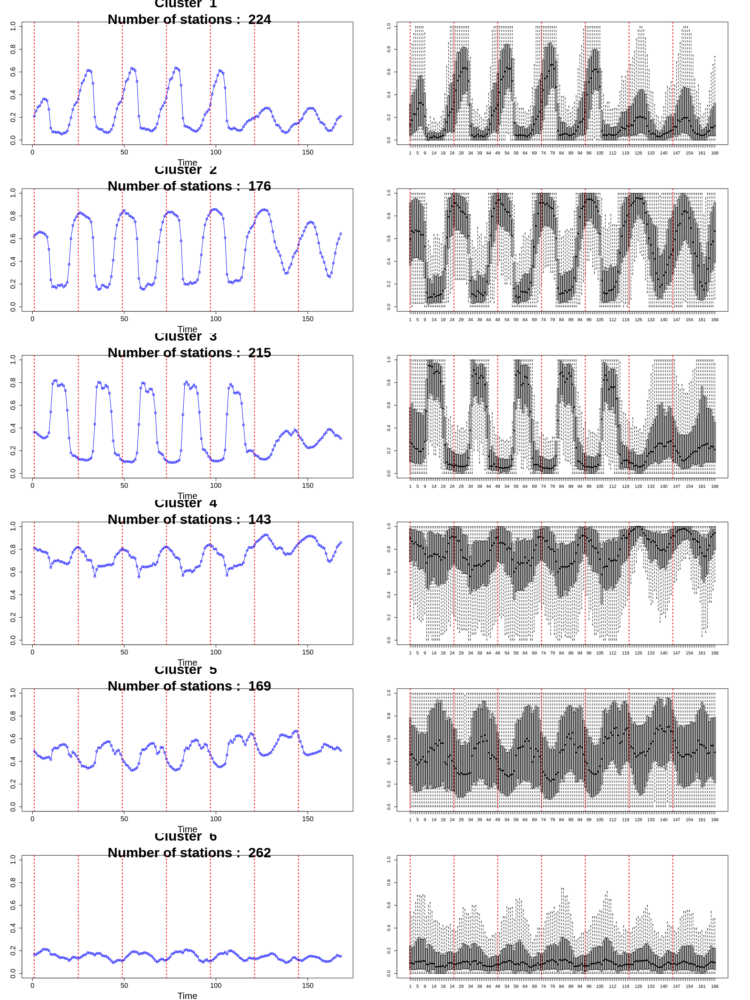

In [ ]:
timeTick <- 1 + 24*(0:6)  # vector corresponding to the beginning of days
par(mar=c(4,4,4,4), mfrow = c(6, 2))
options(repr.plot.width = 18, repr.plot.height = 24)

for (i in 1:max(cut.pca)){
    avg_hourly <- colMeans(x[which(as.factor(cut.pca) == i), 1:168])
    plot(avg_hourly, type = "o", 
         main = paste("Cluster ", i, 
                      "\n Number of stations : ", length(which(cut.pca == i)))
         , xlab = "Time", ylab = "",
         ylim = c(0, 1), col = "blue", 
         cex.main = 3.0, cex.lab=2, cex.axis=1.5)
    abline(v = timeTick, lty = "dotted", col= 'red', lwd = 2)
    boxplot(x[ ,1:168][which(cut.pca == i),1:168], outline=FALSE, ylim=c(0, 1))
    abline(v = timeTick, lty = "dotted", col= 'red', lwd = 2)
}

ℹ Using `zoom = 12`

ℹ Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.



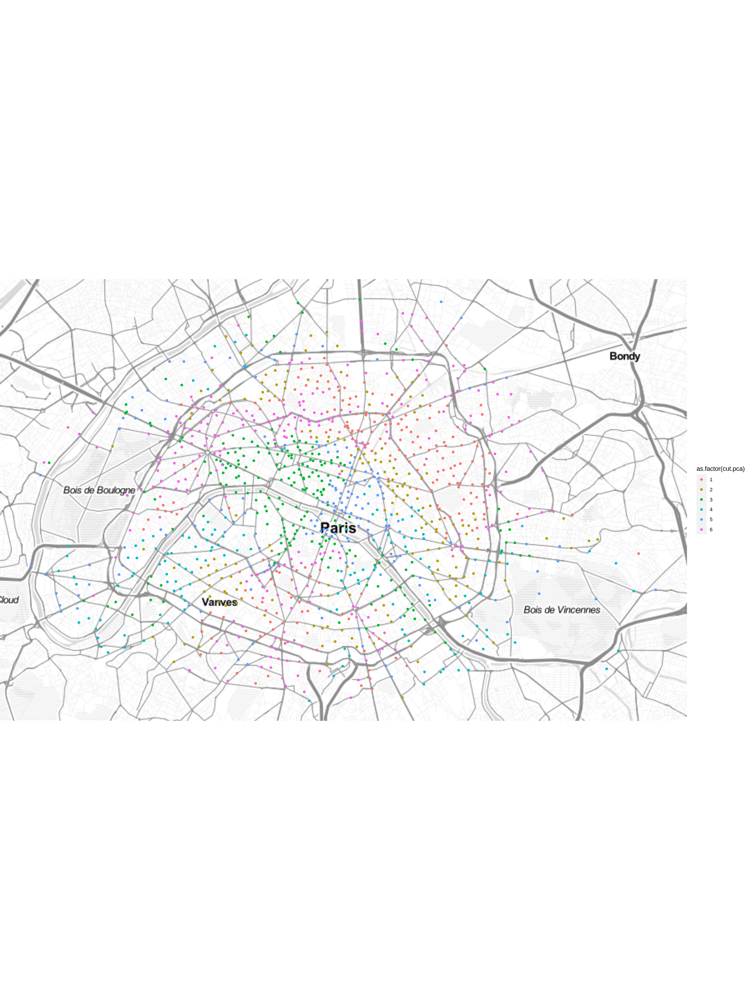

In [ ]:
qmplot(longitude,latitude, data = velib$position,color = as.factor(cut.pca))

# 6. Gaussian Mixture Models (GMM)

In [ ]:
library(mclust)
library(ggpubr)

Package 'mclust' version 6.0.0
Type 'citation("mclust")' for citing this R package in publications.



Approach : Selecting several models of best BIC score, then select one with intra-group variance that best allows interpretation.

## GMM on PCA

---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VEI (diagonal, equal shape) model with 16 components: 

 log-likelihood    n  df       BIC       ICL
      -25569.55 1189 200 -52555.28 -52924.02

Clustering table:
  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16 
 23 139  41  55 177 132  23  77 159  77  69  38  60  43  29  47 

Warning message:
“`gather_()` was deprecated in tidyr 1.2.0.
ℹ Please use `gather()` instead.
ℹ The deprecated feature was likely used in the factoextra package.
  Please report the issue at <https://github.com/kassambara/factoextra/issues>.”


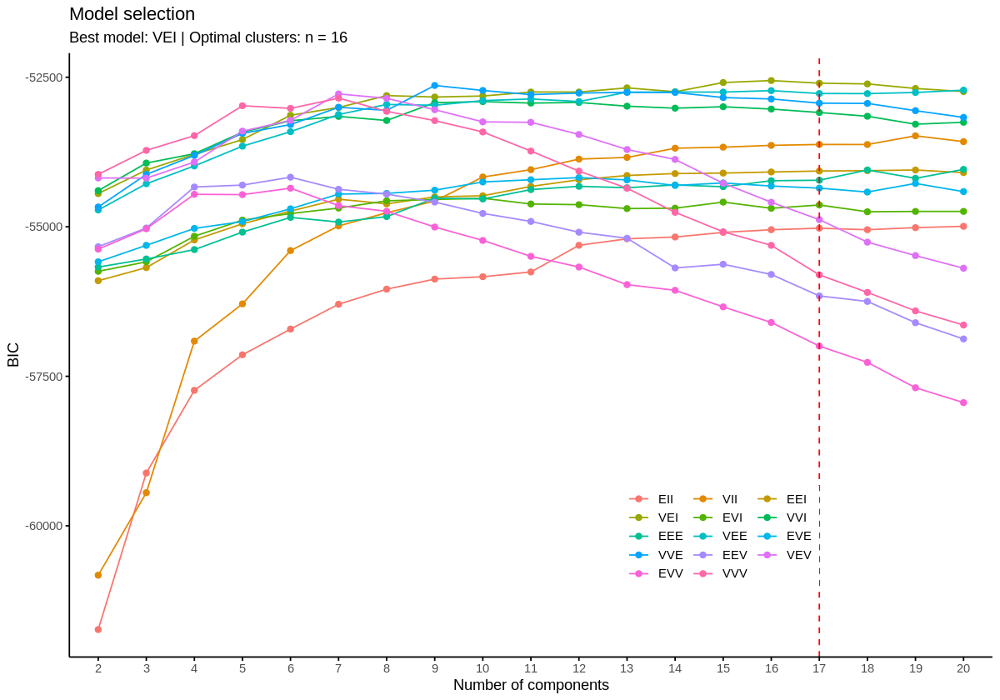

In [ ]:
gmm.bic = Mclust(acp$ind$coord[,1:10], G=2:20)
options(repr.plot.width = 10, repr.plot.height = 7)
summary(gmm.bic)
fviz_mclust(gmm.bic, what="BIC")

The above code allows finding the best model based on BIC score. We limit ourself to a maximum of 20 clusters to have a first look at the evolution of BIC score, then repeat the code with different values of G. 
We obtain the 6 best models in decreasing optimality order : 16 clusters-VEI, 9 clusters-VVE, 11 clusters-VVE, 10 clusters-VEI, 5 clusters-VVV and 7 clusters-VEV. 

Once again, in order to maintain the model's interpretability and assure that there's not too few stations in each cluster, we select the best model between 5 clusters-VVV and 7 clusters-VEV.

### 5 clusters-VVV


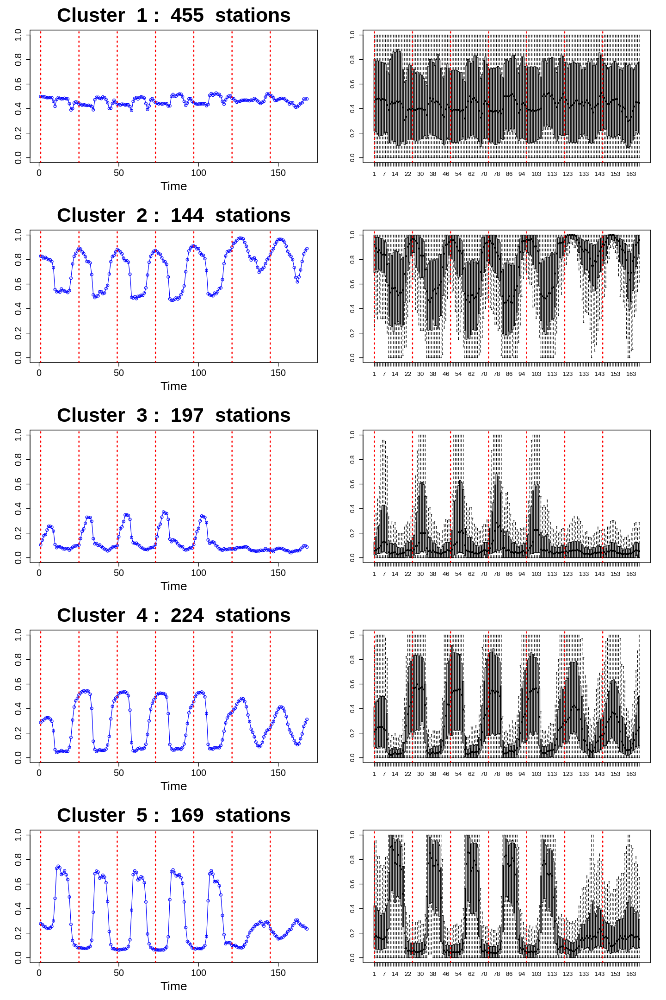

In [ ]:
gmm.bic.best = Mclust(acp$ind$coord[,1:10], G=5, modelNames = 'VVV')
options(repr.plot.width = 12, repr.plot.height = 18)
par(mfrow = c(gmm.bic.best$G, 2))
par(cex.main=2)

timeTick <- 1 + 24*(0:6)  # vector corresponding to the beginning of days
count = table(gmm.bic.best$class)

for (i in 1:gmm.bic.best$G){
    avg_hourly <- colMeans(x[which(as.factor(gmm.bic.best$class) == i), 1:168])

    plot(avg_hourly,  type = "o", col='blue',
            main = paste("Cluster ", i, ": ", count[i], " stations"), 
            xlab = "Time", ylab = "",ylim=(c(0, 1)), 
            cex.main = 3.25, cex.lab=2, cex.axis=1.5)

    abline(v = timeTick, lty = "dotted", col= 'red', lwd = 2)
    boxplot(x[ ,1:168][which(as.factor(gmm.bic.best$class) == i),1:168], outline=FALSE)
    abline(v = timeTick, lty = "dotted", col= 'red', lwd = 2)

}


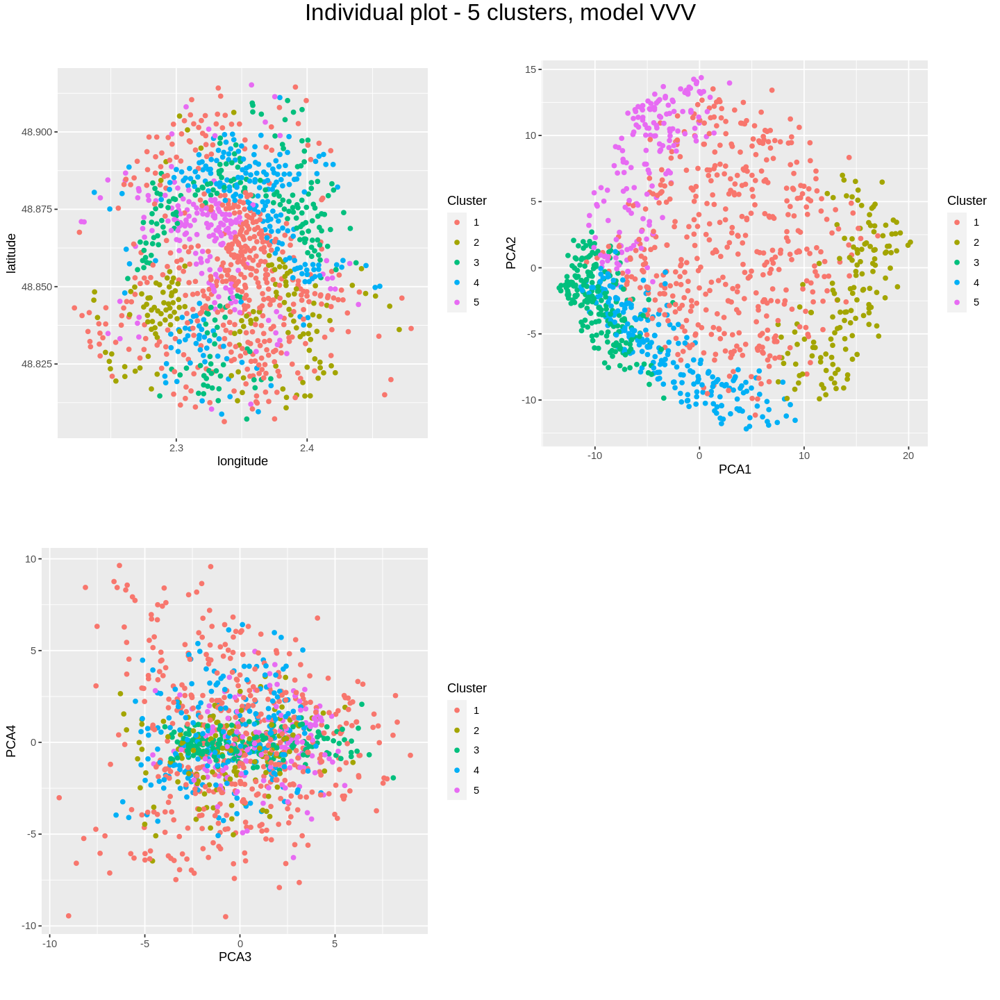

In [ ]:
# fitting GMM
G = 5
modelname = 'VVV'
gmm.bic.best = Mclust(acp$ind$coord[,1:10], G=G, modelNames = modelname)

# plot station position by class
position.cluster = velib$position
position.cluster$class = gmm.bic.best$class
p1 = ggplot(data = position.cluster, aes(x=longitude,y=latitude,col=as.factor(class))) + 
  geom_point() +
  theme(aspect.ratio = 1) + 
  labs(color = "Cluster")

# plot station feature on PCA dimension
coord.cluster = data.frame( acp$ind$coord[,1:10], class = gmm.bic.best$class )
colnames(coord.cluster) = c( sprintf("PCA%d",seq(1:10)), "class" )

p2 = ggplot( data = coord.cluster, aes(x=PCA1, y=PCA2, col=as.factor(class))) + geom_point() + theme(aspect.ratio = 1) + labs(color = "Cluster")
p3 = ggplot( data = coord.cluster, aes(x=PCA3, y=PCA4, col=as.factor(class))) + geom_point() + theme(aspect.ratio = 1) + labs(color = "Cluster")

# plotting settings
options(repr.plot.width = 12, repr.plot.height = 12)
p4 = ggarrange(p1,p2,p3, 
          ncol = 2, nrow = 2)
annotate_figure(p4, text_grob(paste('Individual plot -', G,'clusters, model', modelname), size = 20))

### 7 clusters-VEV

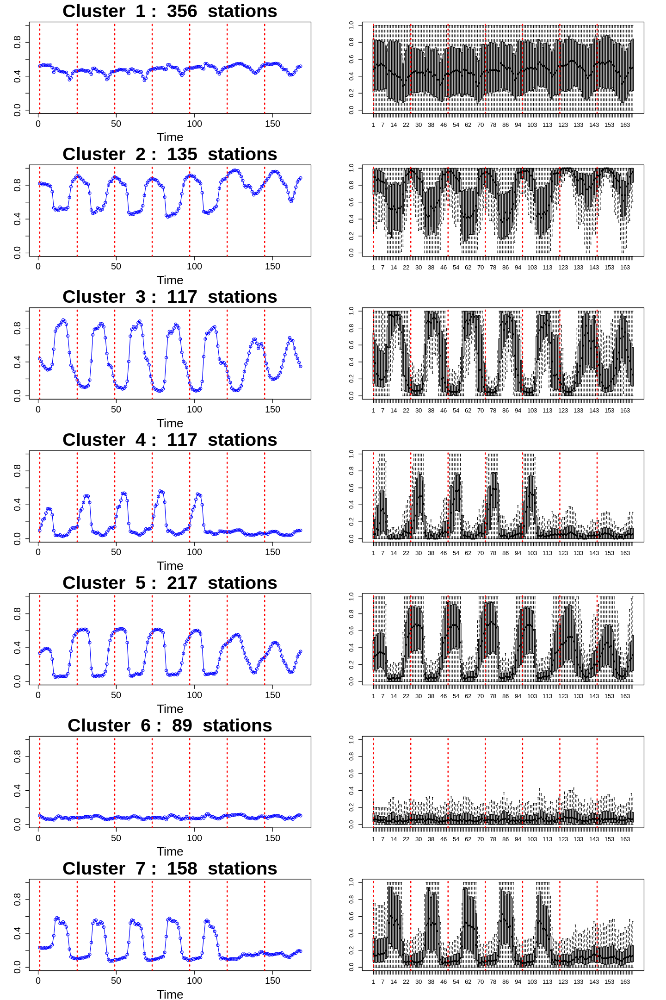

In [ ]:
gmm.bic.best = Mclust(acp$ind$coord[,1:10], G=7, modelNames = 'VEV')
options(repr.plot.width = 12, repr.plot.height = 18)
par(mar = c(4, 4, 3, 3), mfrow = c(gmm.bic.best$G, 2))
par(cex.main=2)

count = table(gmm.bic.best$class)
timeTick <- 1 + 24*(0:6)  # vector corresponding to the beginning of days

for (i in 1:gmm.bic.best$G){
    avg_hourly <- colMeans(x[which(as.factor(gmm.bic.best$class) == i), 1:168])

    plot(avg_hourly, col='blue', type='o',
            main = paste("Cluster ", i, ": ", count[i], " stations"), 
            xlab = "Time", ylab = "",ylim=(c(0, 1)), 
            cex.main = 3, cex.lab=2, cex.axis=1.5)

    abline(v = timeTick, lty = "dotted", col= 'red', lwd = 2)
    boxplot(x[ ,1:168][which(as.factor(gmm.bic.best$class) == i),1:168], outline=FALSE, ylim=c(0, 1))
    abline(v = timeTick, lty = "dotted", col= 'red', lwd = 2)

}

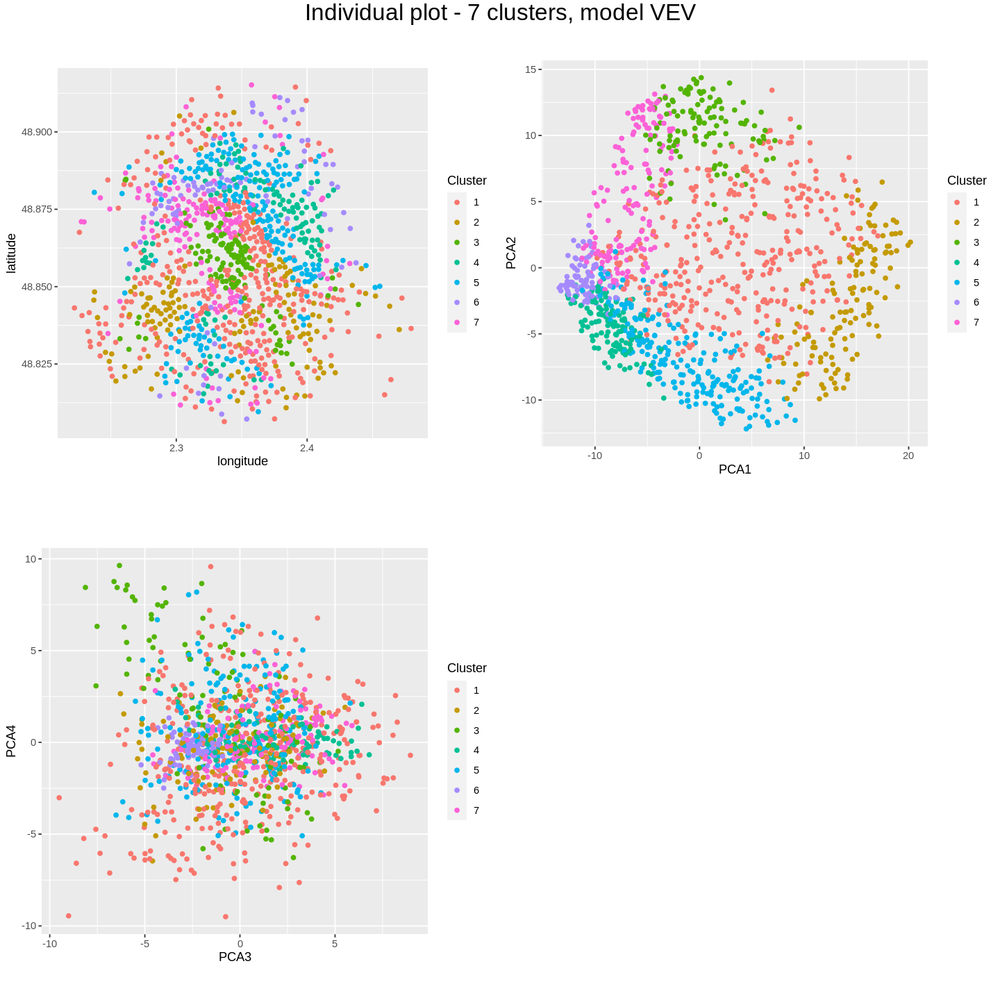

In [ ]:
# fitting GMM
G = 7
modelname = 'VEV'
gmm.bic.best = Mclust(acp$ind$coord[,1:10], G=G, modelNames = modelname)

# plot station position by class
position.cluster = velib$position
position.cluster$class = gmm.bic.best$class
p1 = ggplot(data = position.cluster, aes(x=longitude,y=latitude,col=as.factor(class))) + 
  geom_point() +
  theme(aspect.ratio = 1) + 
  labs(color = "Cluster")

# plot station feature on PCA dimension
coord.cluster = data.frame( acp$ind$coord[,1:10], class = gmm.bic.best$class )
colnames(coord.cluster) = c( sprintf("PCA%d",seq(1:10)), "class" )

p2 = ggplot( data = coord.cluster, aes(x=PCA1, y=PCA2, col=as.factor(class))) + geom_point() + theme(aspect.ratio = 1) + labs(color = "Cluster")
p3 = ggplot( data = coord.cluster, aes(x=PCA3, y=PCA4, col=as.factor(class))) + geom_point() + theme(aspect.ratio = 1) + labs(color = "Cluster")

# plotting settings
options(repr.plot.width = 12, repr.plot.height = 12)
p4 = ggarrange(p1,p2,p3, 
          ncol = 2, nrow = 2)
annotate_figure(p4, text_grob(paste('Individual plot -', G,'clusters, model', modelname), size = 20))

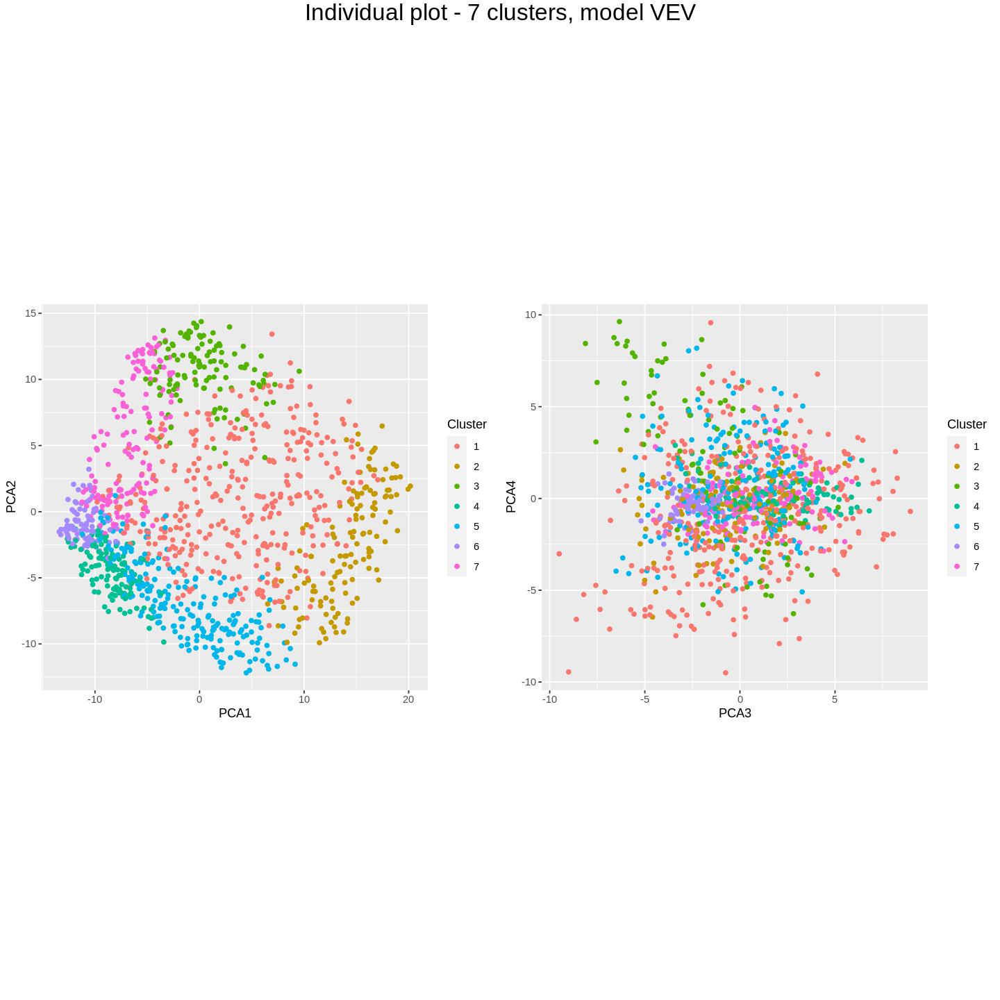

In [ ]:
# plot station position by class
position.cluster = velib$position
position.cluster$class = gmm.bic.best$class
p1 = ggplot(data = position.cluster, aes(x=longitude,y=latitude,col=as.factor(class))) + 
  geom_point() +
  theme(aspect.ratio = 1) + 
  labs(color = "Cluster")

# plot station feature on PCA dimension
coord.cluster = data.frame( acp$ind$coord[,1:10], class = gmm.bic.best$class )
colnames(coord.cluster) = c( sprintf("PCA%d",seq(1:10)), "class" )

p2 = ggplot( data = coord.cluster, aes(x=PCA1, y=PCA2, col=as.factor(class))) + geom_point() + theme(aspect.ratio = 1) + labs(color = "Cluster")
p3 = ggplot( data = coord.cluster, aes(x=PCA3, y=PCA4, col=as.factor(class))) + geom_point() + theme(aspect.ratio = 1) + labs(color = "Cluster")

p4 = ggarrange(p2,p3, ncol = 2, nrow = 1)
annotate_figure(p4, text_grob(paste('Individual plot -', G,'clusters, model', modelname), size = 20))

### Model selection
Based on the individual plot figures, the main difference of the 2 models is the addition of cluster 3 and cluster 6 of the 7-clusters model. The remaining clusters are roughly the same based on the boxplot figures.

From the boxplot figure we can see that these 2 classes have relatively small intra-group variance, which assures the quality of the clustering, and also doesn't disturb the general shape too much, which assures the model interpretability. In addition the 2 clusters represent a significant number of stations (117 and 89), so it makes sense to keep these 2 clusters and select the 7-clusters model.

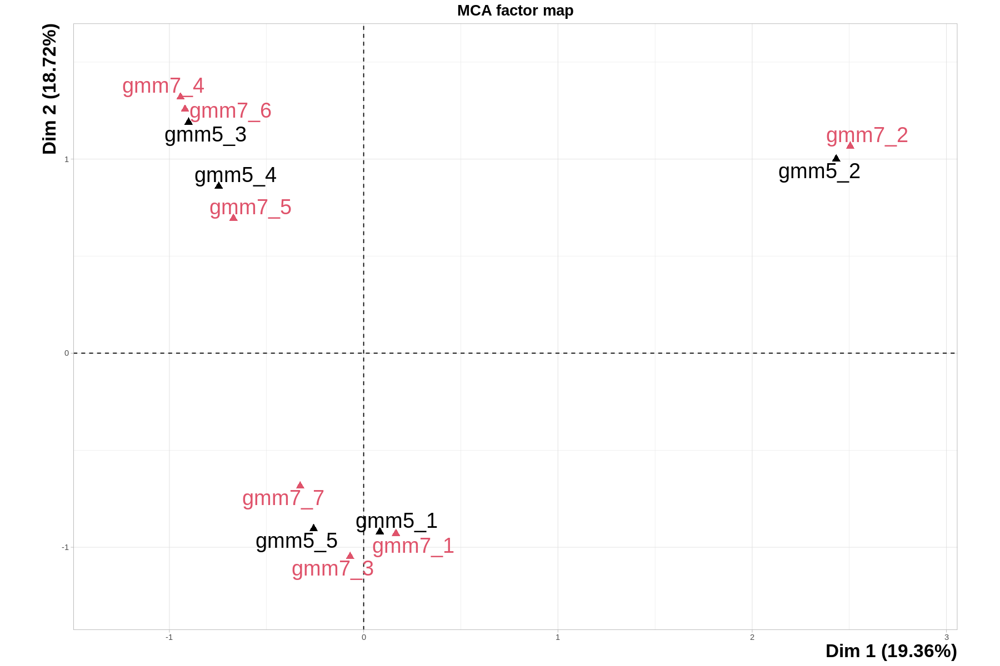

In [ ]:
resgmm5 = Mclust(acp$ind$coord[,1:10], G=5, modelNames = 'VVV')
resgmm7 = Mclust(acp$ind$coord[,1:10], G=7, modelNames = 'VEV')


clu_tab = data.frame(gmm5 = as.factor(resgmm5$classification), gmm7 = as.factor(resgmm7$classification))
afcm <- MCA(clu_tab, graph = FALSE)
options(repr.plot.width = 15, repr.plot.height = 10)

plot(afcm, axes = c(1, 2), choix = "ind", invisible = "ind", habillage = "quali", cex.main=1.5, cex.lab=2, cex.axis=2, cex=2)

### Interpretation approach
In the passage below we consider *loading* to be **low** if *loading*<0.15, medium if >0.15 and < 0.8, **high** if *loading*>=$0.8. 

In order to interprete a cluster, we compare several characteristics of the stations in that cluster.
+ **Weekday-weekend behavior** : The difference between weekday and weekend behaviour of a station may suggest interesting information, like its geographical location or the types of building in its vicinity, which will be discussed later. 

+ **Off-peak time** : We care about off-peak because it represents a demand for bicycle. Note that low value of loading alone is not enough to conclude that a new demand of bicycle occured, since it could be that there's always few bicycle in the station. There has to be an off-peak, which means that a considerable amount of bicycle was taken.

  Off-peak time behaviours are divided into : Morning (around 0h-12h) / Afternoon (23h-0h) / (Generally) No bottom.

+ **Availability of bicycle in the station** : Based on the behaviour of loading, we can judge the availability of bicycle in the station label them accordingly :
    - **Available : loading is generally never low.** 
    
      This means that the station is always available for service.
    - **Lacking : loading is low during off-peak with generally low peak.** 
      
      This represents possible moments of lack of bicycle. Note that a station can have a lot of bicycle in general and be classified as "lacking" at the same time.
    - **Capped : loading is low during off-peak with generally high peak.**
    
      This means that the station is lacking bicycle during its off-peak while is full of bicycle during its peak. This suggests that the station is working at its maximum capacity.

    - **Very scarce : loading is almost always low.**



With these characteristics defined, we can better describe the station clusters :
+ Cluster 2 : All week : Available with off-peak in the afternoon.
+ Cluster 3 : All week : Capped with off-peak in the morning.
+ Cluster 4 : Weekday : Lacking with afternoon off-peak; Weekend : Very scarce, no peak.
+ Cluster 5 : All week : Lacking with afternoon off-peak.
+ Cluster 6 : All week : Very scarce with no off-peak.
+ Cluster 7 : Weekday : Lacking with morning off-peak; Weekend: Very scarce with no peak.

Finally, according to the boxplot figures and the individual plots, the remaining cluster - cluster 1 contains stations of very different behaviours. We can consider it an 'undefined' group with the only characteristic is that it's relatively available during weekday and weekend.

Once the clusters are described, we can easily give further interpretation.

#### 1. Expanding station
Suppose we decided to launch a station expansion operation. According to the clustering, the best stations to target are the stations of cluster 3, as they are working at their almost maximum capacity and the factor limiting them the most is probably their parking capacity.

#### 2. Transporting unused bicycles
Suppose we wanted to transport unused bicycles to stations that are lacking to ensure the service is available at a certain rush hour. Depending on the targeted time period, we can identify the receiving and giving stations according to the clustering.

For example, suppose we target the weekday afternoon period. We look for receivers in clusters that are lacking with afternoon bottom or always lacking during weekday, which suggests taking clusters 4,5 and 6. Note that scarcity in our intepretation only suggests possible lacking moments, which can be the result of very different behaviors. For example, it could mean that the station is in high demand but not reloaded enough, but it could also mean few bicycles are taken or returned to the station, like stations on hills for example. Therefore if the goal of the operation is only providing for stations in high demand, it might be important to study more precise data to determine the target stations.

Technically any of the remaining cluster can be the giver, but if we avoid stations having bottom at the same time (cluster 2), stations working at maximum capacity (cluster 3) and undefined stations (cluster 1), we can select stations from cluster 7 to be givers. Finally, we select appropriate givers and receivers based on other criteria (travelling distance, actual loading capacity, etc.)

#### 3. Identifying workplace / resident area
Based on the bottom time, we can guess which stations are likely to be closed to workplaces and which are closed to resident area. Stations close to workplace should receive bicycles in the morning and lose bicycles in the afternoon, which fits the description of cluster 2,4 and 5. Stations close to resident area, in contrast, fits the description of cluster 3 and 7.

#### 4. Hill
Based on the individual plot, we notice that the hill stations are mostly included in cluster 4 and 6. If we take one step further and refer to our analysis of workplace/resident area, cluster 4 could be stations that are near workplaces. 

Therefore, we can hypothesize that the majority of hill stations fall into one of the two categories : stations that are near workplaces (having the characteristics of cluster 6) and stations that are not (having the characteristics of cluster 4):
+ Hill stations that are near workplaces have afternoon bottom during weekday as people go to work the morning and leave in the afternoon, and have very few bicycle as well as no bottom whatsoever in the weekend as people won't ride uphill to these stations in the weekend. 
+ Hill stations that are not close to workplaces have almost no bicycle at any time for the same reason : people don't usually ride uphill.

## GMM on MCA

In [ ]:
quanti = x[0:168]
x_daynight = sapply(seq(1, ncol(quanti), 12), function(j) rowMeans(quanti[, j+(0:11)]))

colname = c(1:7, 1:7) %>% sort
colname = paste(c('Day', 'Night'), colname)
colnames(x_daynight)=colname

x_discrete = x_daynight %>%
  as.data.frame %>%
  mutate(across(everything(), ~ifelse(. > quantile(., 0.66), 'High',
                                 ifelse(. > quantile(., 0.33), 'Mid', 'Low'))))
x_discrete = cbind(x_discrete, x[169])

head(x_discrete)

,Day 1,Night 1,Day 2,Night 2,Day 3,Night 3,Day 4,Night 4,Day 5,Night 5,Day 6,Night 6,Day 7,Night 7,hill
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>
EURYALE DEHAYNIN,Low,Mid,Mid,Low,Mid,Mid,Mid,Mid,Mid,Mid,Mid,Low,Low,Low,FALSE
LEMERCIER,Mid,Mid,High,Mid,High,Mid,High,Mid,High,Mid,High,Mid,High,Mid,FALSE
MEZIERES RENNES,Low,Mid,Mid,High,Mid,Mid,Mid,High,Mid,High,Mid,High,High,Mid,FALSE
FARMAN,High,High,Mid,Mid,Mid,Mid,Mid,Mid,Mid,Mid,Mid,High,Mid,High,FALSE
QUAI DE LA RAPEE,High,High,Mid,High,Mid,High,Low,High,Mid,High,Mid,Mid,Mid,High,FALSE
CHOISY POINT D'IVRY,Low,Mid,High,Mid,Mid,Mid,Mid,Mid,Low,Mid,High,Mid,Low,Mid,FALSE


In [ ]:
afcm = MCA(x_discrete, quali.sup=15, graph=F)

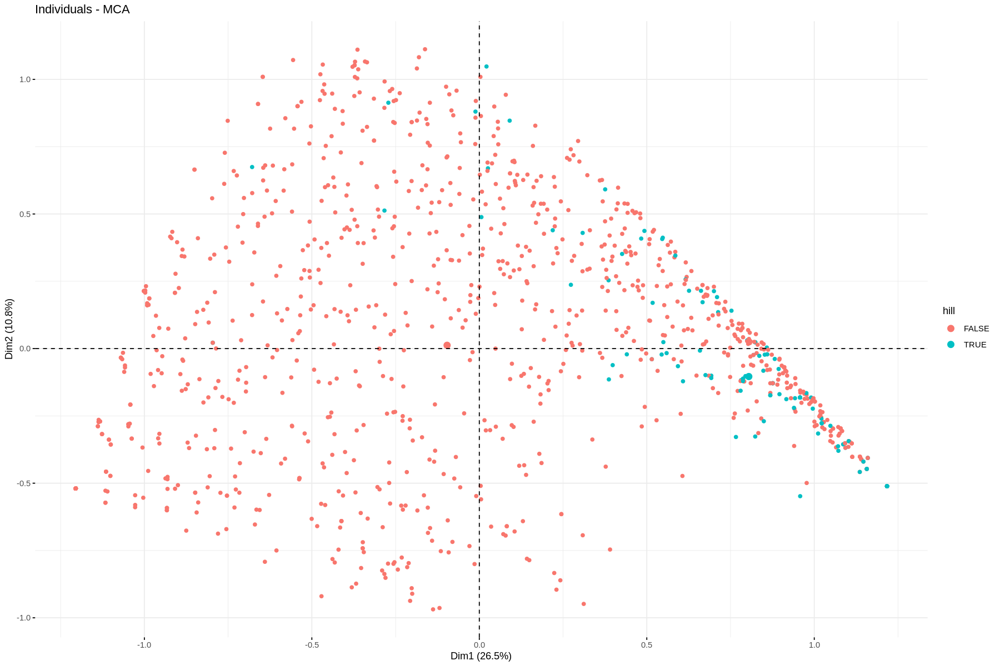

In [ ]:
fviz_mca_ind(afcm, label='none', habillage=15)

---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust EEV (ellipsoidal, equal volume and shape) model with 7 components: 

 log-likelihood    n  df      BIC       ICL
      -978.1347 1189 116 -2777.65 -2962.262

Clustering table:
  1   2   3   4   5   6   7 
163 134 140 313 291  73  75 

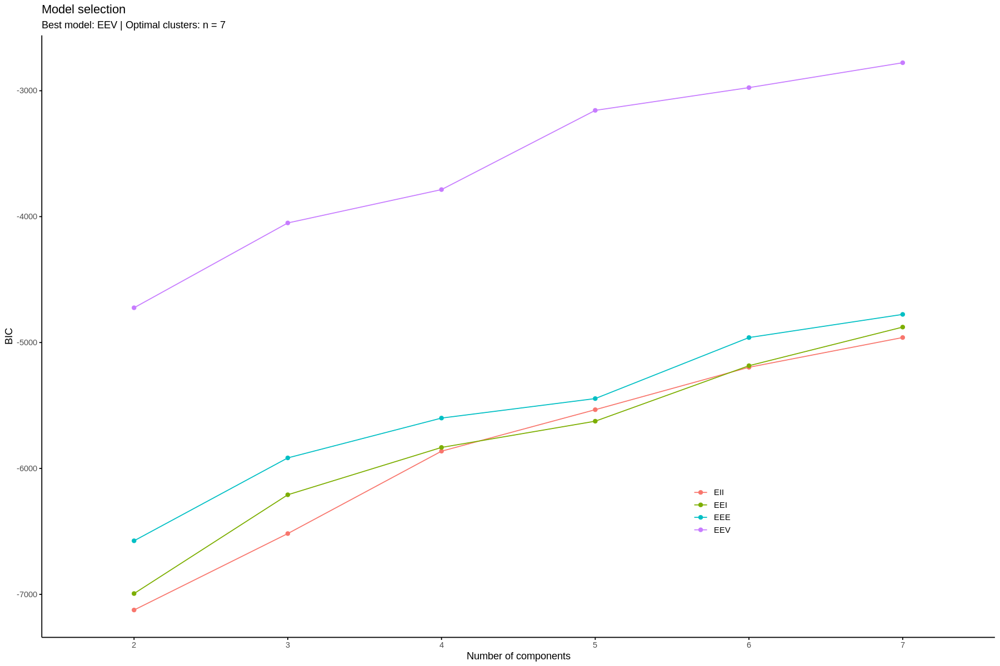

In [ ]:
gmm.bic = Mclust(afcm$ind$coord, G=2:7)
summary(gmm.bic)
fviz_mclust(gmm.bic, what="BIC")
# 7 EEV

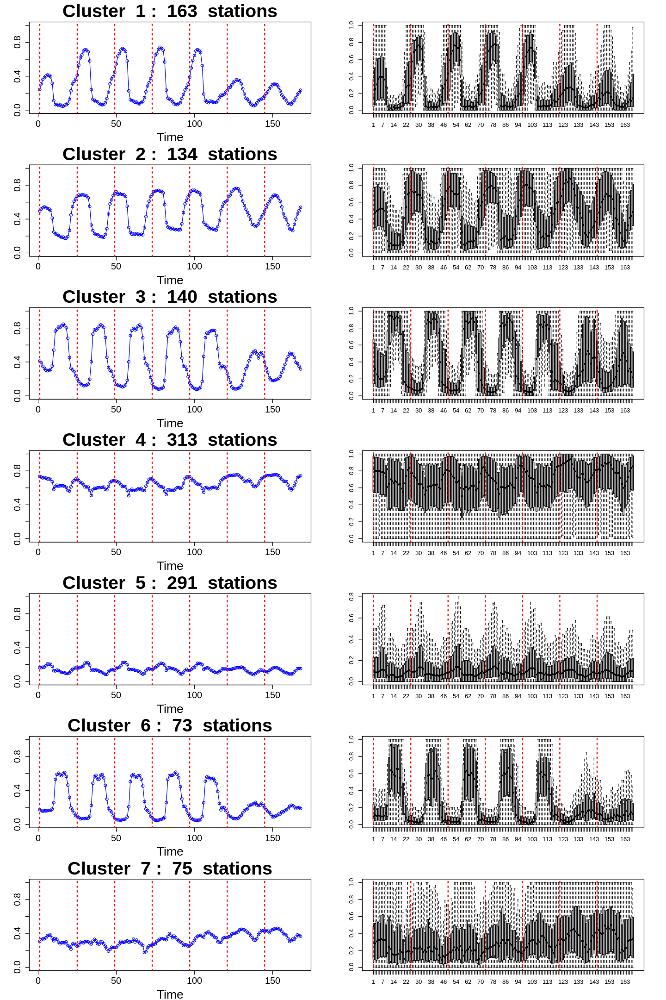

In [ ]:
gmm.bic.best = Mclust(afcm$ind$coord, G=7, modelNames = 'EEV')
options(repr.plot.width = 12, repr.plot.height = 18)
par(mar = c(4, 4, 3, 3), mfrow = c(gmm.bic.best$G, 2))
par(cex.main=2)

count = table(gmm.bic.best$class)
timeTick <- 1 + 24*(0:6)  # vector corresponding to the beginning of days

for (i in 1:gmm.bic.best$G){
    avg_hourly <- colMeans(x[which(as.factor(gmm.bic.best$class) == i), 1:168])

    plot(avg_hourly, type='o', col='blue',
            main = paste("Cluster ", i, ": ", count[i], " stations"), 
            xlab = "Time", ylab = "",ylim=(c(0, 1)), 
            cex.main = 3, cex.lab=2, cex.axis=1.5)

    abline(v = timeTick, lty = "dotted", col= 'red', lwd = 2)
    boxplot(x[ ,1:168][which(as.factor(gmm.bic.best$class) == i),1:168], outline=FALSE)
    abline(v = timeTick, lty = "dotted", col= 'red', lwd = 2)

}

# 7. Comparaison of Different Methodes (by number of cluster, by something else?, by map of Paris of clustered stations, ...)

In [ ]:
# reskm = km.pca$cluster
reshc = cutree(hclust.pca,k=6)
resgmm = resgmm7$classification
# resgmm7 = gmm.bic.best7$classification

In [ ]:
# Create the cluster table 
# clu_tab = data.frame(ahc = as.factor(reshc), gmm5 = as.factor(resgmm5), gmm7 = as.factor(resgmm7))
clu_tab = data.frame(ahc = as.factor(reshc), gmm7 = as.factor(resgmm))
# clu_tab = clu_tab[,-1]
head(clu_tab)

,ahc,gmm7
,<fct>,<fct>
EURYALE DEHAYNIN,1,5
LEMERCIER,2,5
MEZIERES RENNES,3,1
FARMAN,3,3
QUAI DE LA RAPEE,3,1
CHOISY POINT D'IVRY,2,5


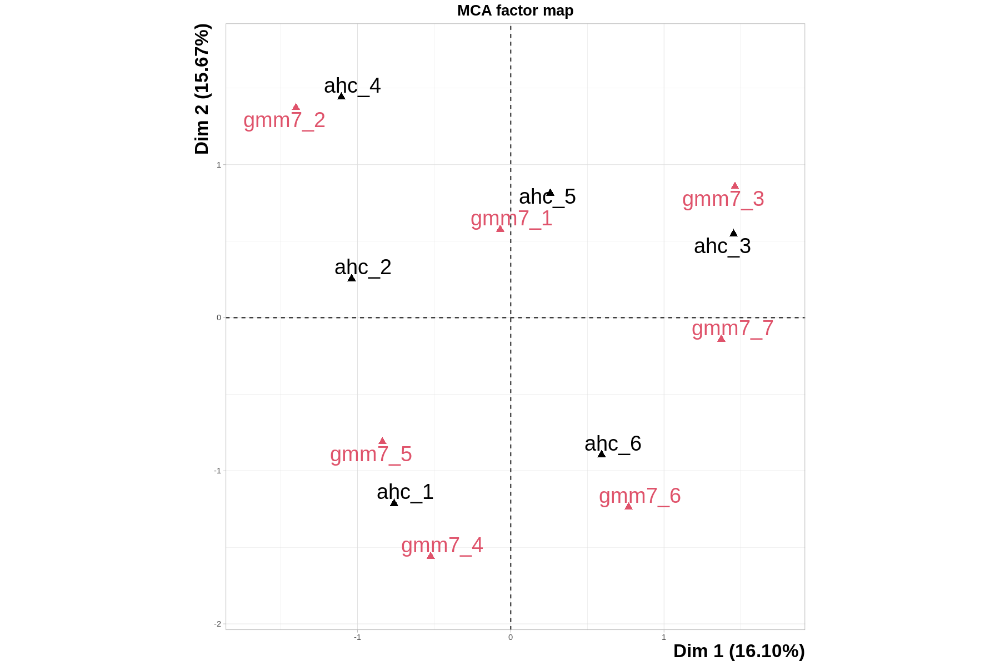

In [ ]:
library(FactoMineR)
afcm <- MCA(clu_tab, graph = FALSE)
options(repr.plot.width = 15, repr.plot.height = 10)

plot(afcm, axes = c(1, 2), choix = "ind", invisible = "ind", habillage = "quali", cex.main=1.5, cex.lab=2, cex.axis=2, cex=2)
# plot(afcm, axes = c(1, 2), choix = "ind", label = "no", cex.main=2, cex.lab=2, cex.axis=2)